# **OpenCV with Python (cv2)**

## **Introduction**

### **About Images**

#### **Raster Images**

Raster images, also known as bitmaps, are digital images composed of a grid of individual, tiny colored squares called pixels. Each pixel contains specific color and tonal information, and when combined in vast numbers, these pixels form a complete, detailed image like a photograph or a graphic.

There are two types of formats in this:
* Lossy compression formats
* Lossless compression formats

##### **Lossy Compression Formats**

These formats reduce file size by discarding some image data. They're ideal for web use but not recommended for analysis.

**JPEG / JPG (Joint Photographic Experts Group)**
* Uses lossy compression to significantly reduce file size.
* Best for photographs and web images where small size matters more than perfect fidelity.
* Does not support transparency.
* Repeated saving can degrade quality due to cumulative compression.

##### **Losssless Compression Format**

These preserve all image data, making them suitable for editing, analysis, and archival.



**PNG (Portable Network Graphics)**

* Uses lossless compression.

* Supports transparency via an alpha channel.

* Commonly used for UI assets, segmentation masks, and overlays.

* Larger file size than JPEG but no quality loss.

**TIFF (Tagged Image File Format)**

* Can be lossless or lossy depending on settings.

* Supports multiple layers, metadata, and high bit-depth.

* Used in medical imaging, publishing, and scientific applications.

* Very large files; slower to load and process.

**WEBP (Web Picture Format)**
* Developed by Google in 2010

* Designed to replace both JPEG and PNG.

* Supports lossy and lossless compression, transparency, and animation.

* Optimized for web performance with smaller file sizes.

##### **Uncompressed Formats**

These store raw pixel data without any compression.



**BMP (Bitmap)**

* No compression; stores pixel data directly.

* Simple format, easy to decode.

* Large file sizes make it impractical for web or storage-heavy applications.

* Rarely used today except in legacy systems or low-level image manipulation.

**Formats hierarchy:**  
BMP → TIFF → JPEG → PNG → WEBP

### **What is OpenCV**

OpenCV (Open Source Computer Vision Library) is an **open-source computer vision and image processing library**.

It provides tools for real-time computer vision, image analysis, and machine learning.

Key points:

* Supports image and video processing.
* Cross-platform (Windows, Linux, macOS, Android, iOS).
* Widely used in applications like object detection, facial recognition, AR/VR, and robotics.

**OPenCV Provides a huge set of functions**:
* Image transformations
* Filtering & edge detection

* Contour detection

* Feature matching & object detection

* Machine learning integration

### **Installation**

Install using pip:

`pip install opencv-python`

### **Importing Required Libraries**

In [1]:
import cv2
import matplotlib.pyplot as plt
import numpy as np

## **Reading and Displaying Images**

### **Reading image: `cv2.imread()`**

* OpenCV reads images using **cv2.imread()**.
* By default, it loads the image in **BGR (Blue-Green-Red) format**.
* Reads image in format of **numpy array**, so the output is numpy ndarray.

In [ ]:
# it accepts a string (imgae path)
img = cv2.imread('images/elephant.jpg')

if img is None:
  print("Error: image not found")
else:
  print("Image loaded successfully")

Image loaded successfully


### **Displaying Image: `cv2.imshow()`**

* OpenCV’s **cv2.imshow()** opens a separate window.
* Only works in local environments.
* Other way to display is by using **matplotlib** (but the color format should be changed **BGR -> RGB**)

Using **cv2.imshow()**

In [ ]:
img = cv2.imread('images/elephant.jpg')

if img is not None:
  print(f"Type of readed image is: {type(img)}")
  print(f"\nShape of image is: {img.shape}")

Type of readed image is: <class 'numpy.ndarray'>

Shape of image is: (240, 300, 3)


shape is (height, width, channels)

In [ ]:
# displaying the image using cv2.imshow()
'''
cv2.imshow('window name',img1) -- it acceps two arguments one is window name, and other is the readed image name.
cv2.waitKey() -- used to exit from the window after cretain time.
cv2.destroyAllWindows() -- used to destroy all the opened windows.
'''

cv2.imshow('window', img)
cv2.waitKey(0)              #if we pass any integer (window will display that much milliseconds)
cv2.destroyAllWindows()

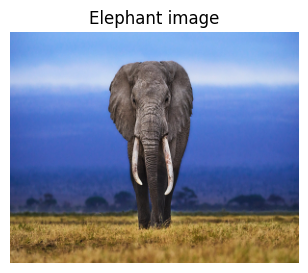

In [ ]:
# displaying image using matplotlib
# the color codes should be changed (BGR->RGB)

# without changing
plt.figure(figsize=(5, 3))
plt.imshow(img)
plt.axis('off')
plt.title('Elephant image')
plt.show()

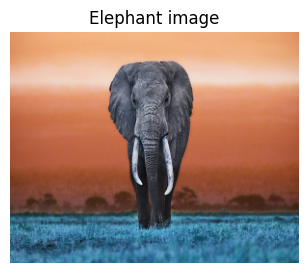

In [ ]:
# with change (correct image)

img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB) # used to convert the color code of image
plt.figure(figsize=(5, 3))
plt.imshow(img)
plt.axis('off')
plt.title('Elephant image')
plt.show()

### **Image Reading modes**

Type of readed image is: <class 'numpy.ndarray'>
Shape of image is: (240, 300)
dimention of image: 2


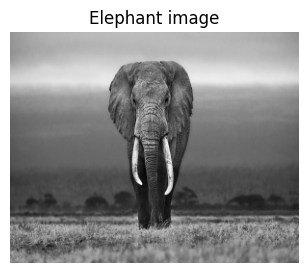

In [ ]:
'''
while reading image by using cv2.imread(), including path we can also pass additional argument
0 - read image as gray
1 - read image as it is
'''

# reading gray image

img = cv2.imread('images/elephant.jpg', 0)
print(f"Type of readed image is: {type(img)}")
print(f"Shape of image is: {img.shape}")
print(f"dimention of image: {img.ndim}")

plt.figure(figsize=(5, 3))
plt.imshow(img, cmap='gray')
plt.axis('off')
plt.title('Elephant image')
plt.show()


Type of readed image is: <class 'numpy.ndarray'>
Shape of image is: (240, 300, 3)
dimention of image: 3


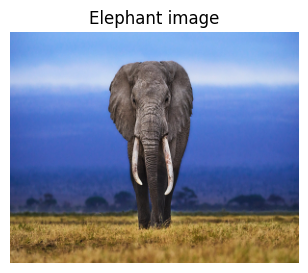

In [ ]:
# reading original image

img = cv2.imread('images/elephant.jpg', 1)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

print(f"Type of readed image is: {type(img)}")
print(f"Shape of image is: {img.shape}")
print(f"dimention of image: {img.ndim}")

plt.figure(figsize=(5, 3))
plt.imshow(img, cmap='gray')
plt.axis('off')
plt.title('Elephant image')
plt.show()

### **Saving image: `cv2.imwrite()`**

In [ ]:
# saving the image

img = cv2.imread('images/elephant.jpg', 0)
print("Resizing the image")
h = int(input('Enter the new height:'))
w = int(input('Enter the new width:'))

# resizing
img = cv2.resize(img, (w, h))

print(f"New Shape of image is: {img.shape}")

# saving
cv2.imwrite('elephant_gray.jpg', img)
print("\nGray scaled elephant image is saved with desired resizing")

Resizing the image
Enter the new height:150
Enter the new width:200
New Shape of image is: (150, 200)

Gray scaled elephant image is saved with desired resizing


## **Basic Image Operations**

### **Image Properties**

* The output of cv2.imread() is a numpy array
* So desired properties like image shape, size, dtype, values can be checked easily.

In [ ]:
# Getting properties of image

img = cv2.imread('images/elephant.jpg')

print(f"Type of readed image: {type(img)}")
print(f"\nShape (H, W, C): {img.shape}")
print(f"\nTotal Pixels: {img.size}")
print(f"\nData type: {img.dtype}")

Type of readed image: <class 'numpy.ndarray'>

Shape (H, W, C): (240, 300, 3)

Total Pixels: 216000

Data type: uint8


### **ROI (Region Of Interest)**

We can **crop a part** of the image **using slicing**.

Shape of image is: (240, 300, 3)
Shape of cropped image is: (160, 100, 3)


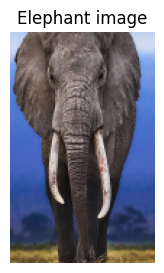

In [ ]:
# crop region [y1:y2, x1:x2]

img = cv2.imread('images/elephant.jpg')

print(f"Shape of image is: {img.shape}")

cropped_img = img[40:200, 100:200]

print(f"Shape of cropped image is: {cropped_img.shape}")

cropped_img = cv2.cvtColor(cropped_img, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(5, 3))
plt.imshow(cropped_img)
plt.axis('off')
plt.title('Elephant image')
plt.show()

### **Resizing image**

Images are resized by using the command `cv2.resize()` (W, H)


In [ ]:
# resing the image

img = cv2.imread('images/elephant.jpg')

print(f"Shape of image is: {img.shape}")

resized = cv2.resize(img, (200, 140))

print(f"New Shape of image is: {resized.shape}")

Shape of image is: (240, 300, 3)
New Shape of image is: (140, 200, 3)


### **Flipping image**

cv2.flip() flips the image:
* 0 -- Flip vertically
* 1 -- Flip horizontally
* -1 -- Flip both vertically and horizontally

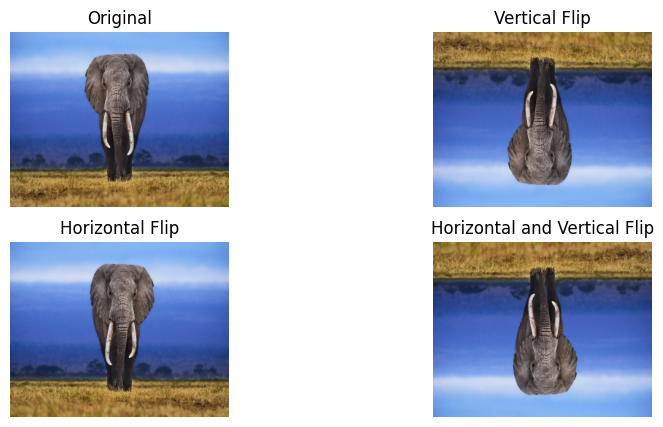

In [ ]:
# flipping image, showing with 4 subplots with respective headings

img = cv2.imread('images/elephant.jpg')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

v_flipped = cv2.flip(img, 0)
h_flipped = cv2.flip(img, 1)
hv_flipped = cv2.flip(img, -1)

plt.figure(figsize=(10, 5))
plt.subplot(2,2,1)
plt.imshow(img)
plt.axis('off')
plt.title('Original')
plt.subplot(2,2,2)
plt.imshow(v_flipped)
plt.axis('off')
plt.title('Vertical Flip')
plt.subplot(2,2,3)
plt.imshow(h_flipped)
plt.axis('off')
plt.title('Horizontal Flip')
plt.subplot(2,2,4)
plt.imshow(hv_flipped)
plt.axis('off')
plt.title('Horizontal and Vertical Flip')
plt.show()

### **Rotating Image**

Fixed rotation (90, 90 anticlockwise, 180):
* cv2.rotate()

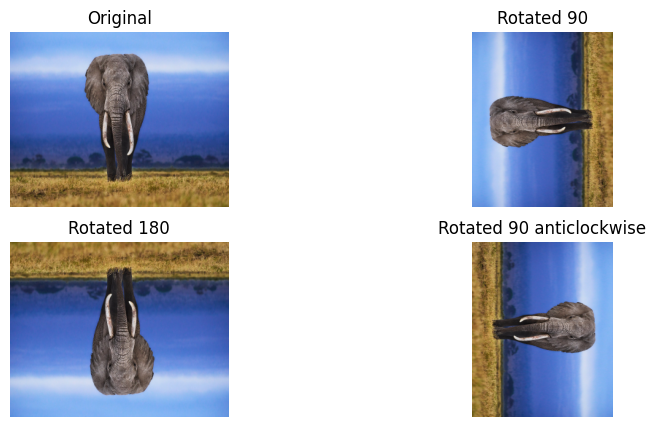

In [ ]:
# fixed rotation

img = cv2.imread('images/elephant.jpg')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

rotated_90 = cv2.rotate(img, cv2.ROTATE_90_COUNTERCLOCKWISE)
rotated_180 = cv2.rotate(img, cv2.ROTATE_180)
rotated_anticlock_90 = cv2.rotate(img, cv2.ROTATE_90_CLOCKWISE)

plt.figure(figsize=(10, 5))
plt.subplot(2,2,1)
plt.imshow(img)
plt.axis('off')
plt.title('Original')
plt.subplot(2,2,2)
plt.imshow(rotated_90)
plt.axis('off')
plt.title('Rotated 90')
plt.subplot(2,2,3)
plt.imshow(rotated_180)
plt.axis('off')
plt.title('Rotated 180')
plt.subplot(2,2,4)
plt.imshow(rotated_anticlock_90)
plt.axis('off')
plt.title('Rotated 90 anticlockwise')
plt.show()

Arbitrary Rotation can be done with :
* cv2.getRotationMatrix2D()
* cv2.warpAffine()

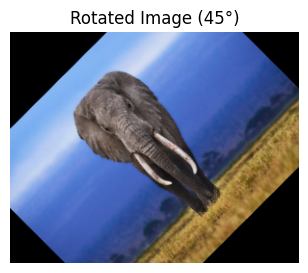

In [ ]:
# arbitrarily rotating image

img = cv2.imread('images/elephant.jpg')

(h, w) = img.shape[:2]

# Rotation matrix (center, angle, scale)
rotation_matrix = cv2.getRotationMatrix2D((w//2, h//2), 45, 1.0)

# Apply rotation
rotated = cv2.warpAffine(img, rotation_matrix, (w, h))

plt.figure(figsize=(5, 3))
plt.imshow(cv2.cvtColor(rotated, cv2.COLOR_BGR2RGB))
plt.title("Rotated Image (45°)")
plt.axis('off')
plt.show()

### **Arithmetic Operations**

OpenCV provides powerful tools to perform pixel-wise arithmetic operations between images. These operations are useful for tasks like masking, blending, highlighting differences, and more.

These operations are performed pixel-by-pixel:

* Addition: `cv2.add(img1, img2)`

* Subtraction: `cv2.subtract(img1, img2)`

* Multiplication: `cv2.multiply(img1, img2)`

* Division: `cv2.divide(img1, img2)`

In [4]:
def group_plot(images, titles, cmap='viridis'):
    num_images = len(images)
    cols = 3
    rows = (num_images + cols - 1) // cols

    plt.figure(figsize=(12, rows*2))
    for i in range(num_images):
        plt.subplot(rows, cols, i + 1)
        plt.imshow(images[i], cmap= cmap)
        plt.title(titles[i])
        plt.axis('off')

    plt.tight_layout()
    plt.show()


In [ ]:
# loading the two images

img1 = cv2.imread('images/cat3.jpg')
img2 = cv2.imread('images/dogs3.webp')

# resizing
img1 = cv2.resize(img1, (400, 400))
img2 = cv2.resize(img2, (400, 400))

# changing form BGR2RGB
img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)

#### **Addition**

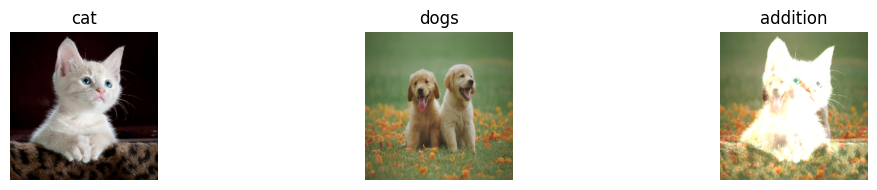

In [7]:
add = cv2.add(img1, img2)
group_plot([img1, img2, add], ['cat', 'dogs', 'addition'])

#### **Subtraction**

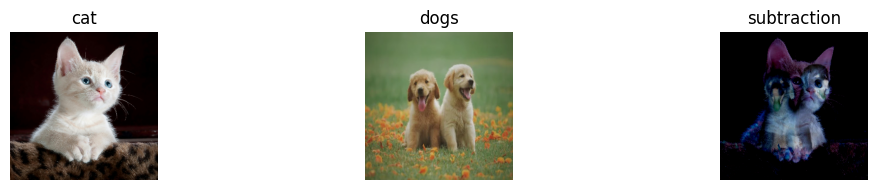

In [8]:
subtract = cv2.subtract(img1, img2)
group_plot([img1, img2, subtract], ['cat', 'dogs', 'subtraction'])

#### **Multiply**

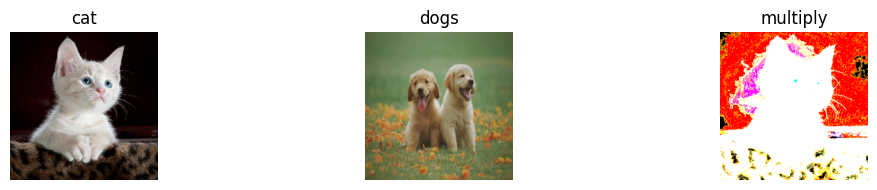

In [15]:
multiply = cv2.multiply(img1, img2)
group_plot([img1, img2, multiply], ['cat', 'dogs', 'multiply'])

#### **Division**

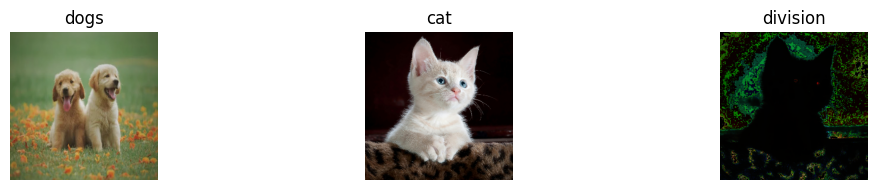

In [13]:
division = cv2.divide(img2, img1)
group_plot([img2, img1, division], ['dogs', 'cat', 'division'])

### **Weighted Arihmetic (Image Blending)**

This technique blends two images using a weighted sum:

* Formula: `result = α * img1 + β * img2 + γ`
* α and β are weights (typically between 0 and 1)
* γ is a scalar added to each sum (often 0)

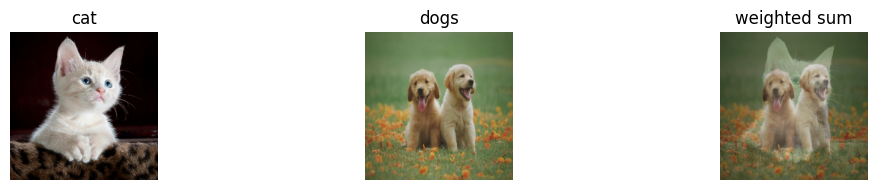

In [16]:
alpha = 0.3
beta = 0.7
gamma = 0

weighted_sum = cv2.addWeighted(img1, alpha, img2, beta, gamma)
group_plot([img1, img2, weighted_sum], ['cat', 'dogs', 'weighted sum'])

## **Drawing functions**

OpenCV provides simple functions to drew shapes and text on images

These functions modify the image array directly

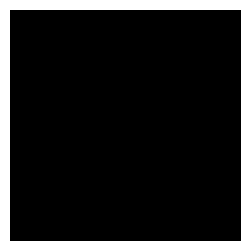

In [ ]:
# creating a blank image

def blnk_image(h=512, w=512, c=3):
  canvas = np.zeros((h, w, c), dtype='uint8')
  return cv2.cvtColor(canvas, cv2.COLOR_BGR2RGB)

img = blnk_image()
plt.figure(figsize=(5, 3))
plt.imshow(img)
plt.axis('off')
plt.show()

### **Drawing line**

`cv2.line(image, start_point, end_point, color, thickness)`

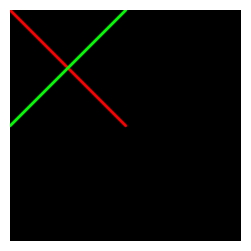

In [ ]:
# drawing a red line

img = blnk_image()
cv2.line(img, (0, 0), (256, 256), (255, 0, 0), 5) # red
cv2.line(img, (0, 256), (256, 0), (0, 255, 0), 5) # green

plt.figure(figsize=(5, 3))
plt.imshow(img)
plt.axis('off')
plt.show()

### **Drawing a Arrowline**

`cv2.arrowedLine(img, starting, ending, color, thickness)`

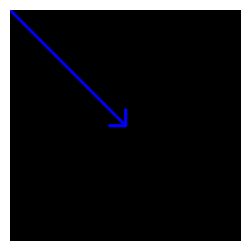

In [ ]:
img = blnk_image()
cv2.arrowedLine(img, (0, 0), (256, 256), (0, 0, 255), 5) # blue

plt.figure(figsize=(5, 3))
plt.imshow(img)
plt.axis('off')
plt.show()

### **Drawing Rectangle**

`cv2.rectangle(img, start_co, end_co, color, thickness)`

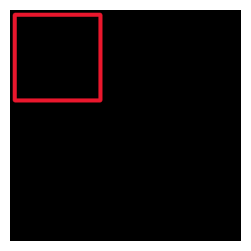

In [ ]:
img = blnk_image()
img3 = cv2.rectangle(img,(10,10),(200,200),(234,23,45),8)

plt.figure(figsize=(5, 3))
plt.imshow(img)
plt.axis('off')
plt.show()

### **Drawing circle**

cv2.circle(img, start, radius, color, thickness)

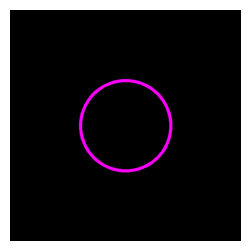

In [ ]:
img = blnk_image()
img = cv2.circle(img, (256, 256), 100, (255, 0, 255), 5)

plt.figure(figsize=(5, 3))
plt.imshow(img)
plt.axis('off')
plt.show()

### **Dawing ellipse**

`cv2.ellipse(img, start_co, (length,height), angle, start angle, end angle, color, thickness)`


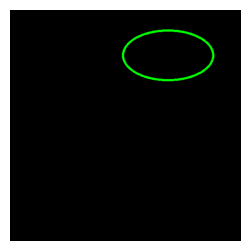

In [ ]:
img = blnk_image()
img = cv2.ellipse(img, (350,100), (100,55), 0, 0, 360, (0,255,0), 3)

plt.figure(figsize=(5, 3))
plt.imshow(img)
plt.axis('off')
plt.show()

### **Writing Text**

cv2.putText(img, text, start_co, font, fontsize, color, thickness, linetype)

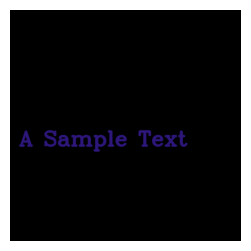

In [ ]:
img = blnk_image()
img = cv2.putText(img,'A Sample Text', (20,300), cv2.FONT_HERSHEY_COMPLEX, 1.5, (45,23,123), 3, cv2.LINE_AA)

plt.figure(figsize=(5, 3))
plt.imshow(img)
plt.axis('off')
plt.show()


## **Image Processing**

* color spaces
* thresholding
* blurring
* edge detection

### **color spaces**

OpenCV supports various color spaces, enabling different representations and manipulations of color information in images.

The most common are:

* BGR ↔ RGB - Convert between OpenCV’s default (BGR) and standard RGB.

* BGR ↔ Grayscale - Convert to single channel gray image.

* BGR ↔ HSV - Hue, Saturation, Value (used for color detection).

* BGR ↔ LAB - Lightness and color channels (good for illumination changes).

#### **BGR ↔ RGB conversion**

OpenCV loads images in BGR, while Matplotlib expects RGB.

In [ ]:
def display_image(img, cmap='viridis', title='Image'):
  fig = plt.figure(figsize=(5, 3))
  ax = fig.add_subplot(111)
  ax.imshow(img, cmap=cmap)
  ax.set_title(title)
  ax.axis('off')
  plt.show()

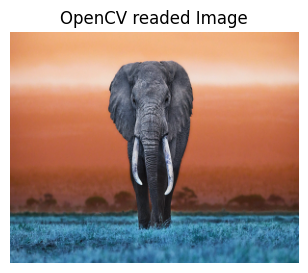

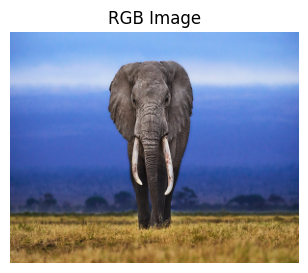

In [ ]:
img = cv2.imread('images/elephant.jpg')
RGB_img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

display_image(img, title='OpenCV readed Image')
display_image(RGB_img, title='RGB Image')

#### **BGR ↔ GrayScale conversion**

Converts 3-channel image to single-channel grayscale.

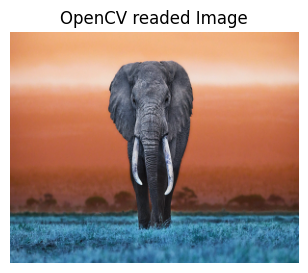

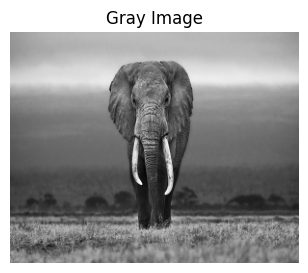

In [ ]:
Grayscale_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

display_image(img, title='OpenCV readed Image')
display_image(Grayscale_img, cmap='gray', title='Gray Image')

#### **BGR ↔ HSV conversion**

HSV separates image color (Hue) from intensity (Value).

Useful for color detection.
* Hue (H): ranges [0–179] in OpenCV, representing color tone (red, green, blue, etc.).

* Saturation (S): intensity of color (0 = gray, 255 = pure color).

* Value (V): brightness (0 = black, 255 = bright).

In [ ]:
hsv_img = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)

# printing certain values for observation

BGR_val = img[50, 50]
print(f"BGR values: {BGR_val}")

HSV_val = hsv_img[50, 50]
print(f"HSV values: {HSV_val}")

BGR values: [237 211 194]
HSV values: [108  46 237]


In [ ]:
# we can also observe by splitting the channels

def split_view(img, titles=None, cmap='gray', show_axes=False):
    channels = cv2.split(img)
    n = len(channels)

    if titles is None:
        titles = [f"C{i+1}" for i in range(n)]

    fig, axes = plt.subplots(1, n, figsize=(5*n, 4))

    if n == 1:
        axes = [axes]

    for ax, ch, t in zip(axes, channels, titles):
        ax.imshow(ch, cmap=cmap)
        ax.set_title(t)
        if not show_axes:
            ax.axis("off")

    plt.tight_layout()
    plt.show()

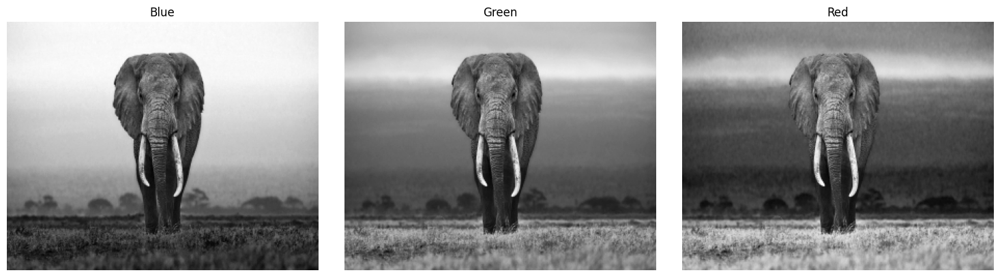

In [ ]:
# for BGR image

split_view(img,   titles=['Blue', 'Green', "Red"])

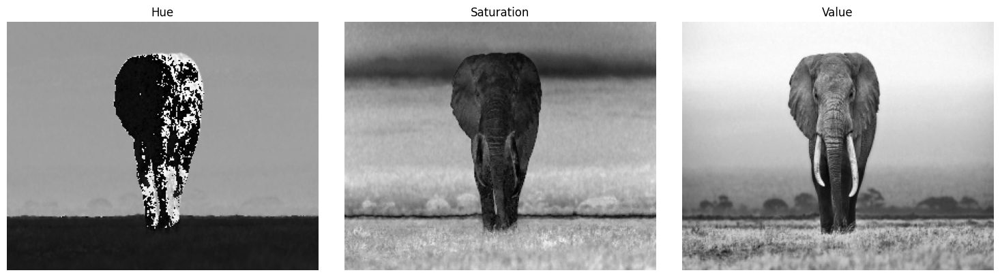

In [ ]:
# for HSV

split_view(hsv_img, titles=['Hue', 'Saturation', 'Value'])

#### **BGR ↔ LAB conversion**

LAB is good for brightness/contrast normalization.

Lab has three channels:

* L = Lightness
    - Ranges from black (0) to white (100).
    - Basically brightness.
* a = Green–Red axis
    - Negative values → Green
    - Positive values → Red
* b = Blue–Yellow axis
    - Negative values → Blue
    - Positive values → Yellow

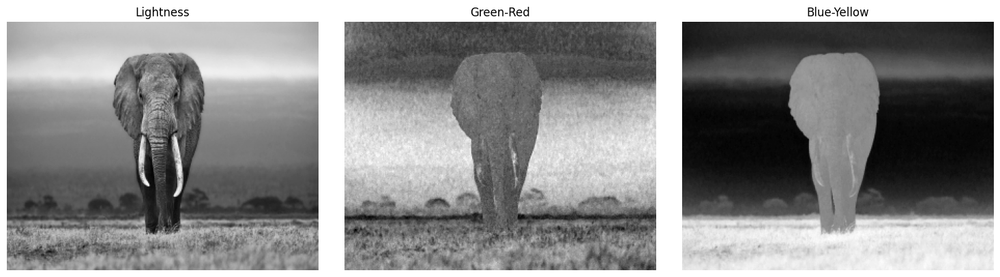

In [ ]:
lab_img = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)

split_view(lab_img, titles=['Lightness', 'Green-Red',  'Blue-Yellow'])

### **Thresholding**

Thresholding is a technique to convert a grayscale image into a binary image (black & white) based on a threshold value.

* Global/Simple Thresholding
* Adaptive Thresholding
* Otsu's Binarization

#### **Global/Simple Thresholding**

* cv2.THRESH_BINARY → if pixel > thresh, set to maxval, else 0

* cv2.THRESH_BINARY_INV → inverse of above

* cv2.THRESH_TRUNC → if pixel > thresh, set to thresh, else keep same

* cv2.THRESH_TOZERO → if pixel > thresh, keep same, else 0

* cv2.THRESH_TOZERO_INV → inverse of above

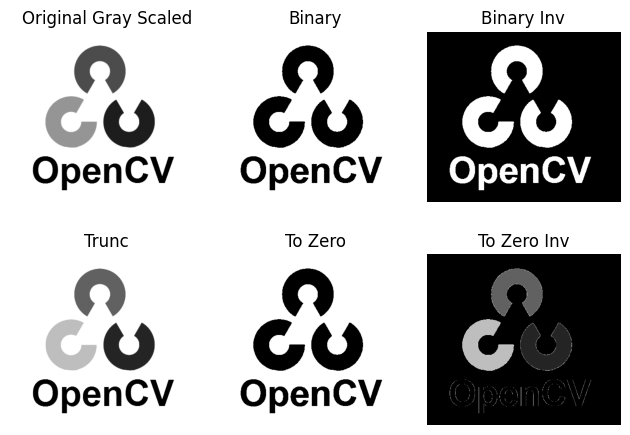

In [ ]:
logo = cv2.imread('images/opencv_logo.png')
gray_logo = cv2.imread('images/opencv_logo.png', 0)

# simple thresholding cv2.threshold(img, thresh, maxval, method)
_, thresh_binary = cv2.threshold(gray_logo, 200, 255, cv2.THRESH_BINARY)
_, thresh_binary_inv = cv2.threshold(gray_logo, 200, 255, cv2.THRESH_BINARY_INV)
_, thresh_trunc = cv2.threshold(gray_logo, 200, 255, cv2.THRESH_TRUNC)
_, thresh_tozero = cv2.threshold(gray_logo, 200, 255, cv2.THRESH_TOZERO)
_, thresh_tozero_inv = cv2.threshold(gray_logo, 200, 255, cv2.THRESH_TOZERO_INV)

titles = ['Original Gray Scaled', 'Binary', 'Binary Inv', 'Trunc', 'To Zero', 'To Zero Inv']
images = [gray_logo, thresh_binary, thresh_binary_inv, thresh_trunc, thresh_tozero, thresh_tozero_inv]

for i in range(6):
    plt.subplot(2, 3, i+1)
    plt.imshow(images[i], cmap='gray')
    plt.title(titles[i])
    plt.axis('off')

plt.tight_layout()
plt.show()

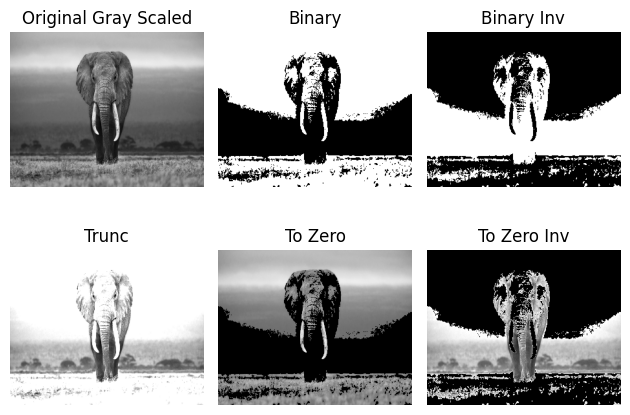

In [ ]:
ele = cv2.imread('images/elephant.jpg')
gray_ele = cv2.imread('images/elephant.jpg', 0)

# simple thresholding cv2.threshold(img, thresh, maxval, method)
_, thresh_binary = cv2.threshold(gray_ele, 100, 255, cv2.THRESH_BINARY)
_, thresh_binary_inv = cv2.threshold(gray_ele, 100, 255, cv2.THRESH_BINARY_INV)
_, thresh_trunc = cv2.threshold(gray_ele, 100, 255, cv2.THRESH_TRUNC)
_, thresh_tozero = cv2.threshold(gray_ele, 100, 255, cv2.THRESH_TOZERO)
_, thresh_tozero_inv = cv2.threshold(gray_ele, 100, 255, cv2.THRESH_TOZERO_INV)

titles = ['Original Gray Scaled', 'Binary', 'Binary Inv', 'Trunc', 'To Zero', 'To Zero Inv']
images = [gray_ele, thresh_binary, thresh_binary_inv, thresh_trunc, thresh_tozero, thresh_tozero_inv]

for i in range(6):
    plt.subplot(2, 3, i+1)
    plt.imshow(images[i], cmap='gray')
    plt.title(titles[i])
    plt.axis('off')

plt.tight_layout()
plt.show()

#### **Adaptive Thresholding**

Used when lighting conditions are not uniform

* `cv2.adaptiveThreshold(src, maxval, adaptiveMethod, thresholdType, blockSize, C)`

* adaptiveMethod can be:
  * cv2.ADAPTIVE_THRESH_MEAN_C → threshold is the mean of neighborhood
  * cv2.ADAPTIVE_THRESH_GAUSSIAN_C → weighted sum of neighborhood (Gaussian)
* blockSize → size of local region (odd number like 11)
* C → a constant subtracted from the mean

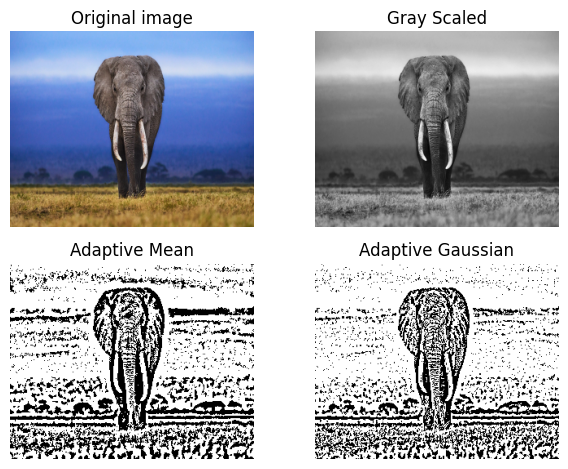

In [ ]:
# elephant img

ele = cv2.imread('images/elephant.jpg')
ele = cv2.cvtColor(ele, cv2.COLOR_BGR2RGB)
gray_ele = cv2.imread('images/elephant.jpg', 0)

ele_adaptive_mean = cv2.adaptiveThreshold(gray_ele, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 11, 2)
ele_adaptive_gaussian = cv2.adaptiveThreshold(gray_ele, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 2)

titles = ['Original image','Gray Scaled', 'Adaptive Mean', 'Adaptive Gaussian']
images = [ele, gray_ele, ele_adaptive_mean, ele_adaptive_gaussian]

for i in range(4):
    plt.subplot(2, 2, i+1)
    if i == 0:
      plt.imshow(images[i])
    else:
      plt.imshow(images[i], cmap='gray')
    plt.title(titles[i])
    plt.axis('off')

plt.tight_layout()
plt.show()

#### **Otsu's Binarization**

Otsus's method automatically calculates the optimal value

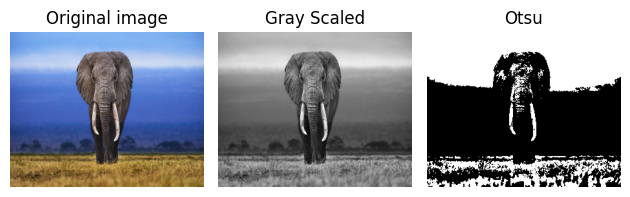

In [ ]:
ele = cv2.imread('images/elephant.jpg')
ele = cv2.cvtColor(ele, cv2.COLOR_BGR2RGB)
gray_ele = cv2.imread('images/elephant.jpg', 0)

_, ele_otsu = cv2.threshold(gray_ele, 0, 255, cv2.THRESH_BINARY+cv2.THRESH_OTSU)

titles = ['Original image','Gray Scaled', 'Otsu']
images = [ele, gray_ele, ele_otsu]

for i in range(3):
    plt.subplot(1, 3, i+1)
    if i == 0:
      plt.imshow(images[i])
    else:
      plt.imshow(images[i], cmap='gray')
    plt.title(titles[i])
    plt.axis('off')

plt.tight_layout()
plt.show()

#### **All methods on a sample image**

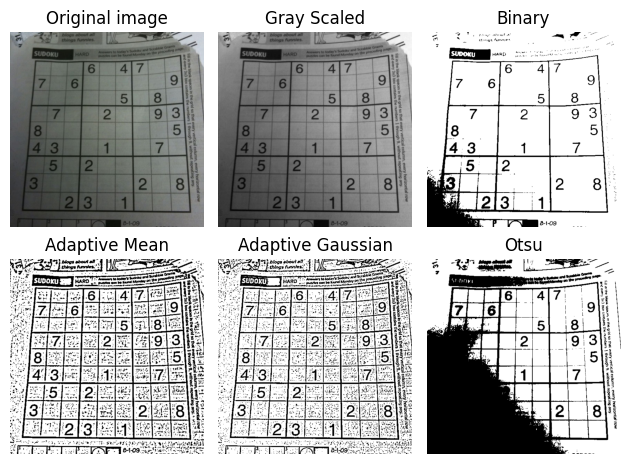

In [ ]:
sudoku = cv2.imread('images/sudokubig.jpg')
sudoku = cv2.cvtColor(sudoku, cv2.COLOR_BGR2RGB)
gray_sudoku = cv2.cvtColor(sudoku, cv2.COLOR_RGB2GRAY)

# simple thresholding
_, sudoku_thresh_binary = cv2.threshold(gray_sudoku, 60, 255, cv2.THRESH_BINARY)

# adaptive thresholding
sudoku_adaptive_mean = cv2.adaptiveThreshold(gray_sudoku, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 11, 2)
sudoku_adaptive_gaussian = cv2.adaptiveThreshold(gray_sudoku, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 2)

# otsu's binarization
_, sudoku_otsu = cv2.threshold(gray_sudoku, 0, 255, cv2.THRESH_BINARY+cv2.THRESH_OTSU)

titles = ['Original image','Gray Scaled', 'Binary', 'Adaptive Mean', 'Adaptive Gaussian', 'Otsu']
images = [sudoku, gray_sudoku, sudoku_thresh_binary, sudoku_adaptive_mean, sudoku_adaptive_gaussian, sudoku_otsu]

for i in range(6):
    plt.subplot(2, 3, i+1)
    if i == 0:
      plt.imshow(images[i])
    else:
      plt.imshow(images[i], cmap='gray')
    plt.title(titles[i])
    plt.axis('off')

plt.tight_layout()
plt.show()

### **Blurring**

OpenCV provides various methods for blurring (smoothing) images, which are essentially low-pass filters used to reduce noise and soften details.

* Average Blurring - simple mean on all pixels in the kernel
* Gaussian Blurring - Weighted average with Guassian kernel
* Median Blurring - Median of neighbouring pixels (good for salt-papper noise)
* Bilateral Filtering - Smooths image but preserves edges.

#### **Average Blurring**

In [ ]:
def group_plot(images, titles, cmap='viridis'):
    num_images = len(images)
    cols = 3
    rows = (num_images + cols - 1) // cols

    plt.figure(figsize=(12, rows*2))
    for i in range(num_images):
        plt.subplot(rows, cols, i + 1)
        if i == 0:
            plt.imshow(images[i], cmap= cmap)
        else:
            plt.imshow(images[i], cmap=cmap)
        plt.title(titles[i])
        plt.axis('off')

    plt.tight_layout()
    plt.show()


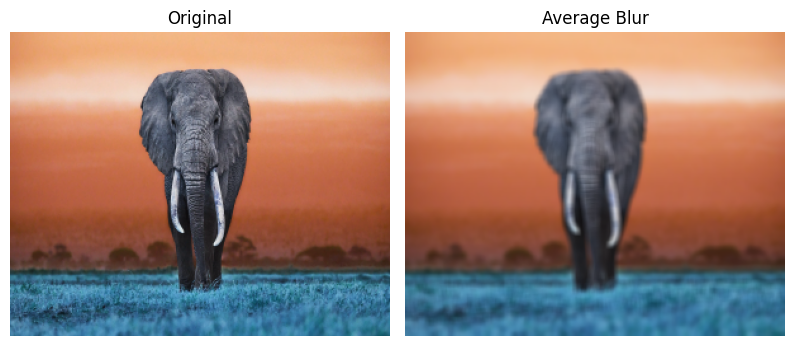

In [ ]:
ele = cv2.imread('images/elephant.jpg')
blur_ele = cv2.blur(ele, (5, 5))

images = [ele, blur_ele]
titles = ['Original', 'Average Blur']

group_plot(images, titles)


#### **Gaussian Blurring**

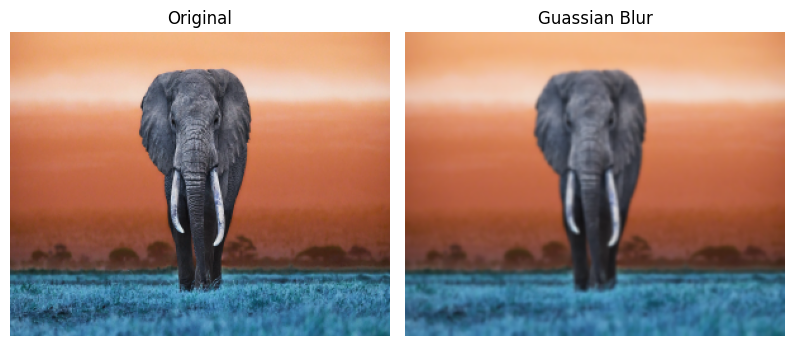

In [ ]:
ele = cv2.imread('images/elephant.jpg')
ele_blur_guassian = cv2.GaussianBlur(img, (5, 5), 0)

images = [ele, ele_blur_guassian]
titles = ['Original', 'Guassian Blur']

group_plot(images, titles)

#### **Median Blurring**

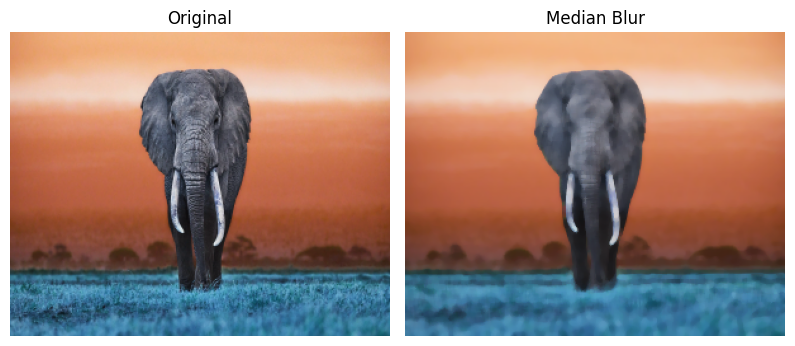

In [ ]:
ele = cv2.imread('images/elephant.jpg')
ele_blur_median = cv2.medianBlur(img, 5)

images = [ele, ele_blur_median]
titles = ['Original', 'Median Blur']

group_plot(images, titles)

#### **Bilateral Filtering**

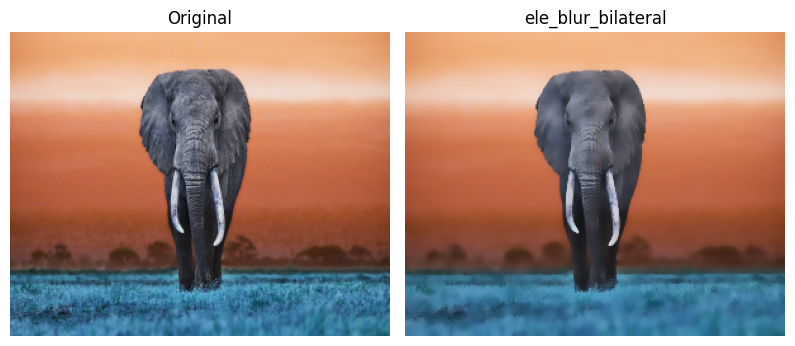

In [ ]:
ele = cv2.imread('images/elephant.jpg')
ele_blur_bilateral = cv2.bilateralFilter(img, 9, 75, 75)

images = [ele, ele_blur_bilateral]
titles = ["Original", "ele_blur_bilateral"]

group_plot(images, titles)

### **Edge Detection**

OpenCV provides several methods for detecting edges:
* sobel Operator - Detects edges in horizontal/vertical directions.
* Laplacian Operator - Detects edges using second-order derivatives.
* Canny Edge Detector - Multi-stage edge detection.

#### **Sobel Operator**

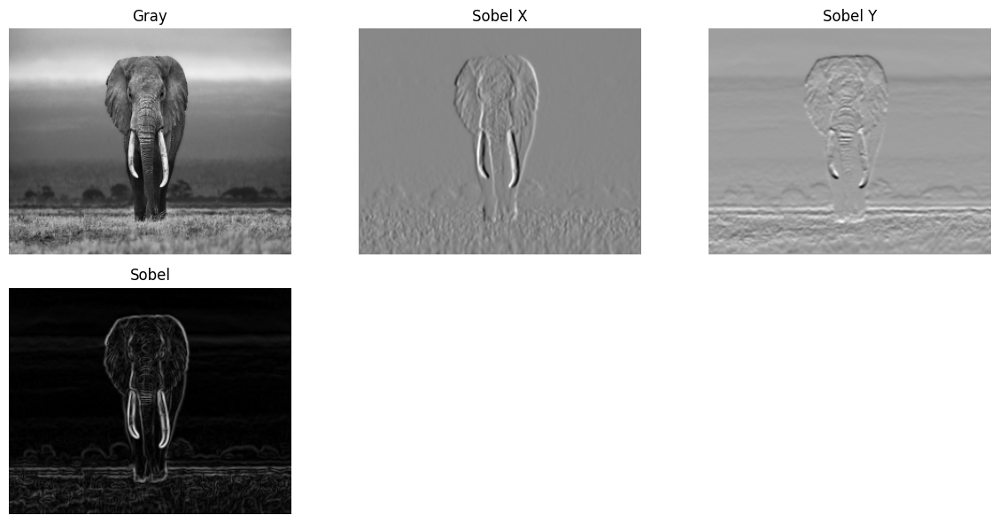

In [ ]:
ele_gray = cv2.imread('images/elephant.jpg', 0)
ele_sobel_x = cv2.Sobel(ele_gray, cv2.CV_64F, 1, 0, ksize=5)
ele_sobel_y = cv2.Sobel(ele_gray, cv2.CV_64F, 0, 1, ksize=5)
ele_sobel = cv2.magnitude(ele_sobel_x, ele_sobel_y)

images = [ele_gray, ele_sobel_x, ele_sobel_y, ele_sobel]
titles = ['Gray', 'Sobel X', 'Sobel Y', 'Sobel']

group_plot(images, titles, cmap='gray')

#### **Laplasian Operator**

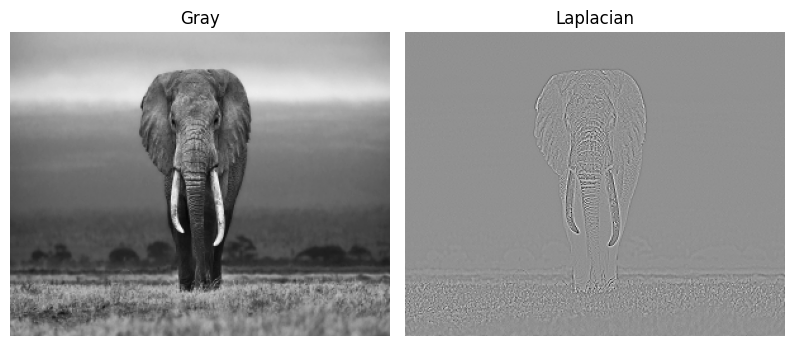

In [ ]:
ele_gray_img = cv2.imread('images/elephant.jpg', 0)
ele_laplacian = cv2.Laplacian(ele_gray_img, cv2.CV_64F)

images = [ele_gray_img, ele_laplacian]
titles = ['Gray', 'Laplacian']

group_plot(images, titles, cmap='gray')

#### **Canny Edge Detector**

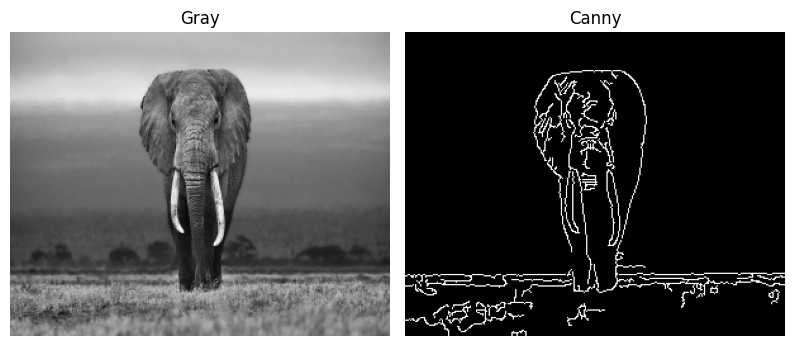

In [ ]:
ele_gray_img = cv2.imread('images/elephant.jpg', 0)

blur = cv2.GaussianBlur(ele_gray_img, (5, 5), 0)
ele_canny = cv2.Canny(blur, 50, 150)

images = [ele_gray_img, ele_canny]
titles = ['Gray', 'Canny']

group_plot(images, titles, cmap='gray')

## **Morphological Transformation**

These are image processing operations applied on binary images (usually after thresholding) to remove noise, enhance structures, or extract shapes.

Common Operations:
* Erosion – Shrinks white regions.
* Dilation – Expands white regions.
* Opening – Erosion followed by dilation (removes small noise).
* Closing – Dilation followed by erosion (fills small holes).
* Morphological Gradient – Difference between dilation and erosion.
* TopHat – Original image minus Opening (extracts small bright regions).
* BlackHat – Closing minus Original image (extracts small dark regions).

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

### **Erosion**

In [ ]:
hand = cv2.imread('hand.jpg', 0)
_, hand_binary = cv2.threshold(hand, 50, 255, cv2.THRESH_BINARY)

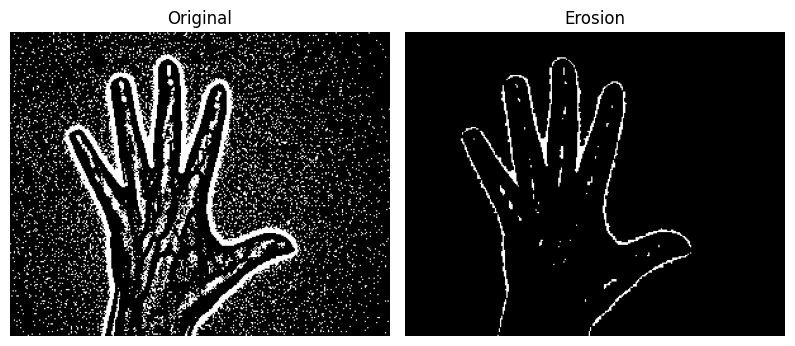

In [ ]:
erosion = cv2.erode(hand_binary, np.ones((3, 3), np.uint8), iterations=1)

images = [hand_binary, erosion]
titles = ['Original', 'Erosion']

group_plot(images, titles, cmap='gray')

### **Dilation**

In [ ]:
hand = cv2.imread('hand.jpg', 0)
_, hand_binary = cv2.threshold(hand, 50, 255, cv2.THRESH_BINARY)

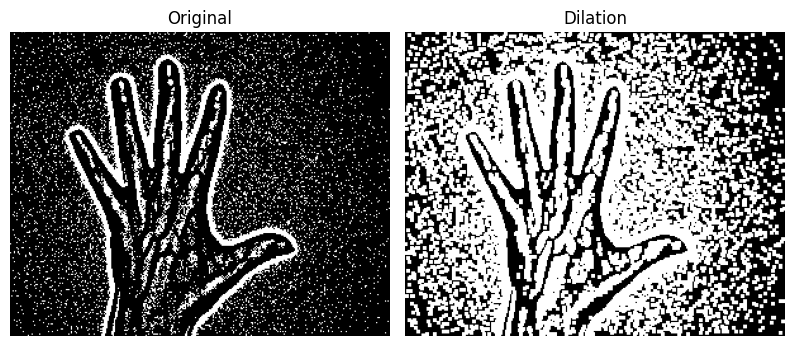

In [ ]:
dilation = cv2.dilate(hand_binary, np.ones((3, 3), np.uint8), iterations=1)

images = [hand_binary, dilation]
titles = ['Original', 'Dilation']

group_plot(images, titles, cmap='gray')

### **Opening (Erosion + Dilation)**

In [ ]:
hand = cv2.imread('hand.jpg', 0)
_, hand_binary = cv2.threshold(hand, 100, 255, cv2.THRESH_BINARY)

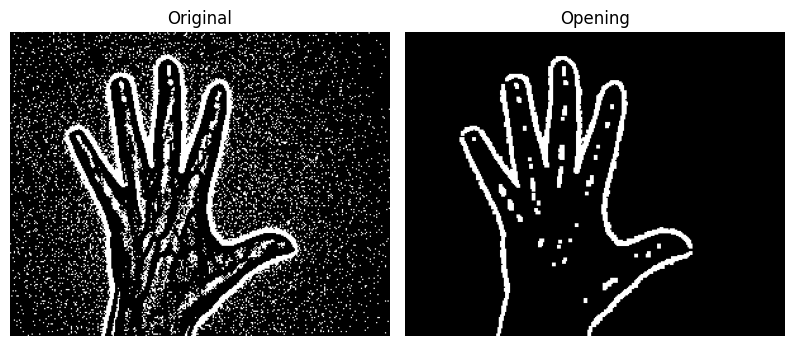

In [ ]:
opening = cv2.morphologyEx(hand_binary, cv2.MORPH_OPEN, np.ones((3, 3), np.uint8), iterations=1)

images = [hand_binary, opening]
titles = ['Original', 'Opening']

group_plot(images, titles, cmap='gray')

### **Closing (Dilation + Erosion)**

In [ ]:
hand = cv2.imread('hand.jpg', 0)
_, hand_binary = cv2.threshold(hand, 100, 255, cv2.THRESH_BINARY)

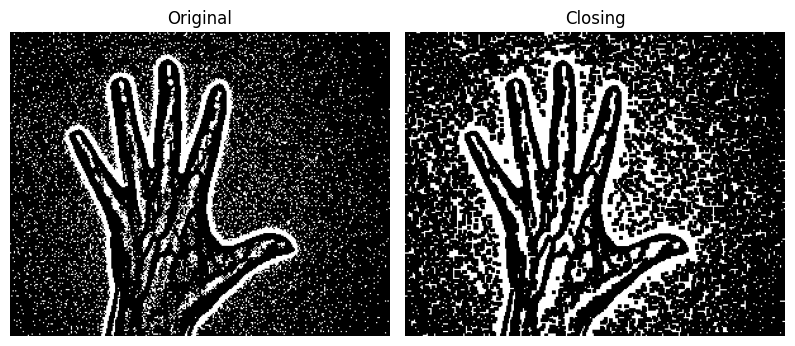

In [ ]:
closing = cv2.morphologyEx(hand_binary, cv2.MORPH_CLOSE, np.ones((3, 3), np.uint8), iterations=1)

images = [hand_binary, closing]
titles = ['Original', 'Closing']

group_plot(images, titles, cmap='gray')

### **Morphological Gradient (Dilation - Erosion)**

In [ ]:
hand = cv2.imread('hand.jpg', 0)
_, hand_binary = cv2.threshold(hand, 100, 255, cv2.THRESH_BINARY)

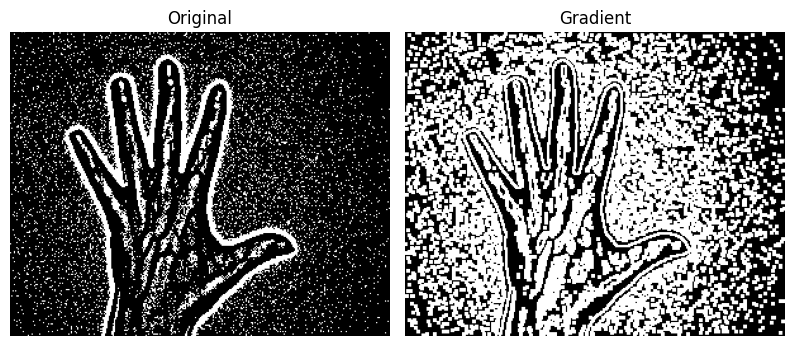

In [ ]:
gradient = cv2.morphologyEx(hand_binary, cv2.MORPH_GRADIENT, np.ones((3, 3), np.uint8), iterations=1)

images = [hand_binary, gradient]
titles = ['Original', 'Gradient']

group_plot(images, titles, cmap='gray')

### **TopHat**

In [ ]:
hand = cv2.imread('hand.jpg', 0)
_, hand_binary = cv2.threshold(hand, 100, 255, cv2.THRESH_BINARY)

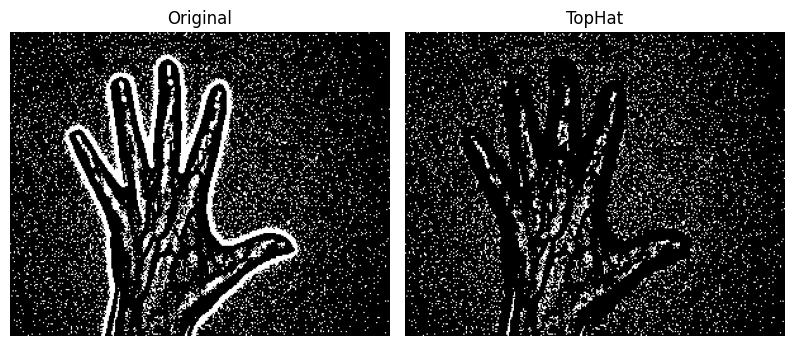

In [ ]:
tophat = cv2.morphologyEx(hand_binary, cv2.MORPH_TOPHAT, np.ones((3, 3), np.uint8), iterations=1)

images = [hand_binary, tophat]
titles = ['Original', 'TopHat']

group_plot(images, titles, cmap='gray')

### **BlackHat**

In [ ]:
hand = cv2.imread('hand.jpg', 0)
_, hand_binary = cv2.threshold(hand, 100, 255, cv2.THRESH_BINARY)

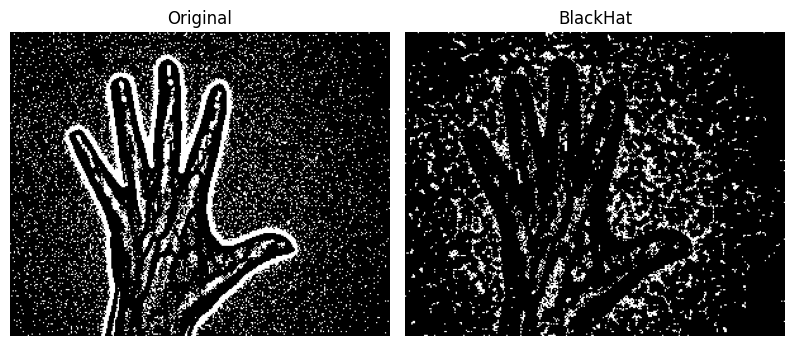

In [ ]:
blackhat = cv2.morphologyEx(hand_binary, cv2.MORPH_BLACKHAT, np.ones((3, 3), np.uint8), iterations=1)

images = [hand_binary, blackhat]
titles = ['Original', 'BlackHat']

group_plot(images, titles, cmap='gray')

## **Contours**

* Contours are one of the most powerful tools in OpenCV for object detection, shape analysis, and image segmentation.
* Contours are simply curves joining all continuous points along a boundary with the same color or intensity.
* Input images for contour detection should be binary images (after thresholding or edge detection).

In [ ]:
# loading the image
sign = cv2.imread('images/image4.png')
sign_gray = cv2.cvtColor(sign, cv2.COLOR_BGR2GRAY)
_, sign_binary = cv2.threshold(sign_gray, 180, 255, cv2.THRESH_BINARY)

Number of contours found: 17


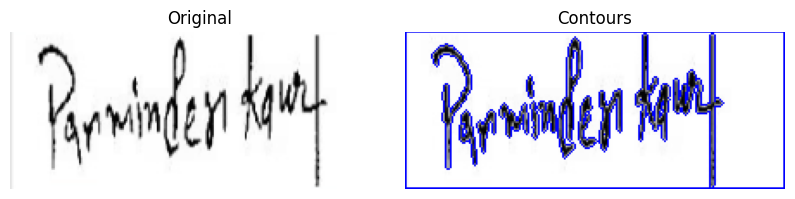

In [ ]:
# finding contours
contours, hierarchy = cv2.findContours(sign_binary, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

# all contours
contour_img = sign.copy()
cv2.drawContours(contour_img, contours, -1, (255, 0, 0), 1)

sign = cv2.cvtColor(sign, cv2.COLOR_BGR2RGB)
contour_img = cv2.cvtColor(contour_img, cv2.COLOR_BGR2RGB)

images = [sign, contour_img]
titles = ['Original', 'Contours']

print(f"Number of contours found: {len(contours)}")

group_plot(images, titles)

## **Connected Components and Analysis**

Connected components in image processing are groups of adjacent, similarly-valued pixels that form distinct "blobs" or regions within an image, identified through a process called connected component analysis (CCA) or connected component labeling (CCL).  
This technique is used to segment an image, assign unique labels to each identified object, and extract features for object recognition, tracking, and other computer vision tasks.

* **Input Image**: The input image for these functions must be an 8-bit single-channel binary image (typically black and white, where objects are white/foreground and background is black). You might need to threshold your image before applying CCL.
* **Background Label**: The background is assigned label 0.

### **cv2.connectedComponents()**

This function takes a binary image as input and returns the number of connected components and a labeled image. In the labeled image, each connected component is assigned a unique integer label (starting from 1), while the background is typically labeled as 0.

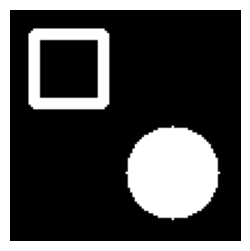

In [ ]:
# example 1

img = np.zeros((100, 100), dtype=np.uint8)
cv2.rectangle(img, (10, 10), (40, 40), 255, 4)
cv2.circle(img, (70, 70), 20, 255, -1)

#viewing img
plt.figure(figsize=(3, 3))
plt.imshow(img, cmap='gray')
plt.axis('off')
plt.show()

Number of connected components: 3


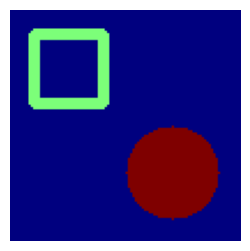

In [ ]:
# connected components

num_labels, labels = cv2.connectedComponents(img) # no of labels, labeled image
print(f"Number of connected components: {num_labels}") # two objects, background

# viewing the labeled image
plt.figure(figsize=(3, 3))
plt.imshow(labels, cmap='jet')
plt.axis('off')
plt.show()

### **cv2.ConnectedComponentsWithStats()**

This function is similar to connectedComponents() but also provides statistics for each connected component, such as bounding box coordinates, area, and centroid.  
It returns the number of labels, the labeled image, statistics for each label, and centroids for each label.

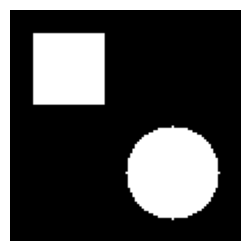

In [ ]:
# simple binary image

img = np.zeros((100, 100), dtype=np.uint8)
cv2.rectangle(img, (10, 10), (40, 40), 255, -1)
cv2.circle(img, (70, 70), 20, 255, -1)

# image visualize
plt.figure(figsize=(3, 3))
plt.imshow(img, cmap='gray')
plt.axis('off')
plt.show()

Number of connected components: 3
Stats:
 [[   0    0  100  100 7782]
 [  10   10   31   31  961]
 [  50   50   41   41 1257]]
Centroids:
 [[49.21421228 49.21421228]
 [25.         25.        ]
 [70.         70.        ]]


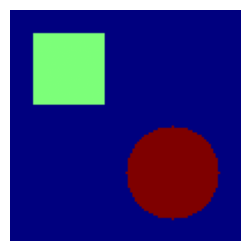

In [ ]:
# connected compnents anaysis

num_labels, labels, stats, centroids = cv2.connectedComponentsWithStats(img)
print(f"Number of connected components: {num_labels}")
print(f"Stats:\n {stats}") # left, top, width, height, area
print(f"Centroids:\n {centroids}") # [x, y] coordinates

# visualize
plt.figure(figsize=(3, 3))
plt.imshow(labels, cmap='jet')
plt.axis('off')
plt.show()

## **Image Segmentation**

Image segmentation is the process of dividing an image into multiple parts (segments) to make it easier to analyze.  
For example:
* Separating objects from the background.
* Detecting shapes or regions of interest.

In this notebook, we will explore different segmentation techniques using OpenCV:
1. Thresholding (basic segmentation)
2. Adaptive Thresholding
3. Color-based Segmentation (using HSV color space + masks)
4. Edge-based Segmentation (Canny + Contours)
5. Watershed Algorithm (advanced segmentation)

In [ ]:
def group_plot(images, titles, cmap='viridis'):
    num_images = len(images)
    cols = 3
    rows = (num_images + cols - 1) // cols

    plt.figure(figsize=(12, 6))
    for i in range(num_images):
        plt.subplot(rows, cols, i + 1)
        if i == 0:
            plt.imshow(images[i], cmap= cmap)
        else:
            plt.imshow(images[i], cmap=cmap)
        plt.title(titles[i])
        plt.axis('off')

    plt.tight_layout()
    plt.show()


### **Thresholding**

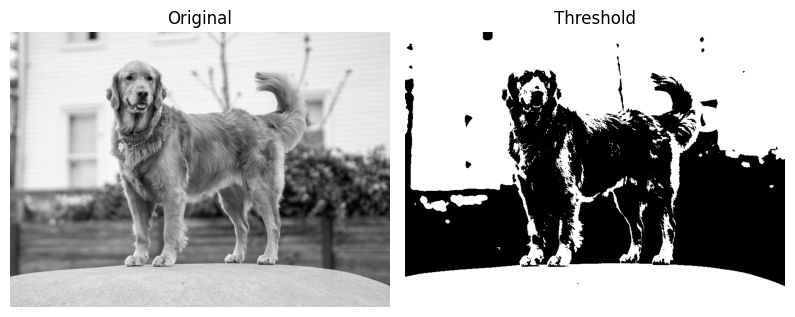

In [ ]:
# we will use otsu thresholding, that will select the best thresholding

gray = cv2.imread('images/dog.jpeg', 0)

_, th = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY+cv2.THRESH_OTSU)

images = [gray, th]
titles = ['Original', 'Threshold']

group_plot(images, titles, cmap='gray')

### **Adaptive Thresholding**

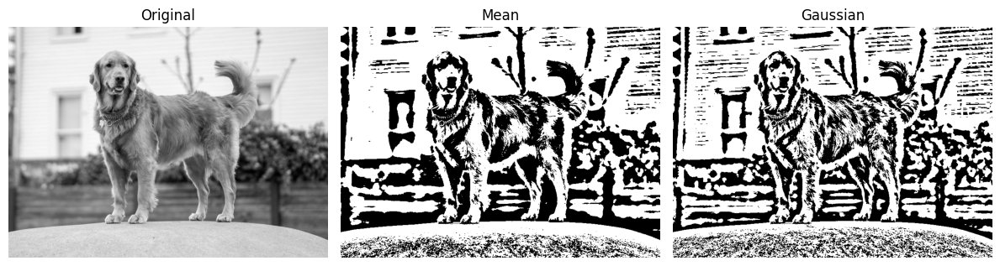

In [ ]:
# adaptively does thresholding with window size

gray = cv2.imread('images/dog.jpeg', 0)

th_mean = cv2.adaptiveThreshold(gray, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 71, 2)
th_gaussian = cv2.adaptiveThreshold(gray, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 71, 2)

images = [gray, th_mean, th_gaussian]
titles = ['Original', 'Mean', 'Gaussian']

group_plot(images, titles, cmap='gray')

### **Color-based segmentation**

* Images in RGB are not great for segmentation
* we convert to HSV (Hue, Saturation, Value) for easier colordetection.
* Like extracting only blue regions from the image

In [ ]:
# reading image

img = cv2.imread('images/dog.jpeg')
hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)

# Define brown color range
lower_brown = np.array([10, 100, 0])
upper_brown = np.array([20, 255, 255])

# mask creation
mask = cv2.inRange(hsv, lower_brown, upper_brown)

# apply mask to original image
result = cv2.bitwise_and(img, img, mask=mask)


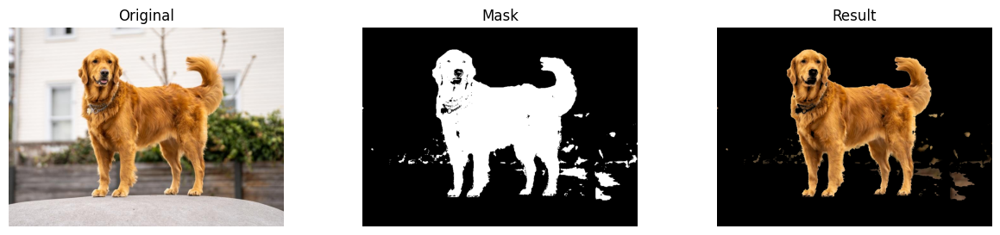

In [ ]:
plt.figure(figsize=(15, 3))
plt.subplot(1,3,1)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.title('Original')
plt.axis('off')

plt.subplot(1,3,2)
plt.imshow(mask, cmap='gray')
plt.title('Mask')
plt.axis('off')

plt.subplot(1,3,3)
plt.imshow(cv2.cvtColor(result, cv2.COLOR_BGR2RGB))
plt.title('Result')
plt.axis('off')

plt.show()

### **Edge based Segmentation**

we can detect the edges in the image and then find **contours** (object boundaries)
* Apply canny edge detection.
* Find contours using opencv.

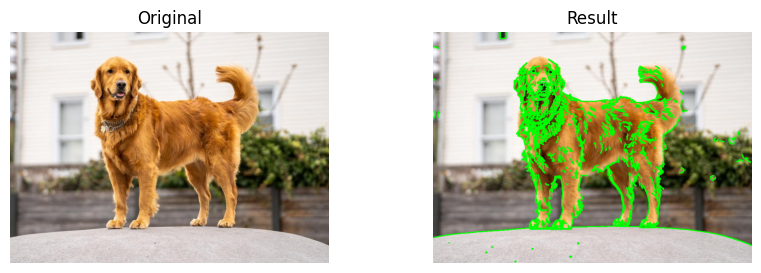

In [ ]:
# reading and applying canny
img = cv2.imread('images/dog.jpeg')
img_gray = cv2.imread('images/dog.jpeg', 0)
edges = cv2.Canny(img_gray, 100, 200)

# find contours
contours, _ = cv2.findContours(edges, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# Draw contours
contour_img = img.copy()
cv2.drawContours(contour_img, contours, -1, (0, 255, 0), 2)

# plotting

plt.figure(figsize=(10, 3))
plt.subplot(1,2,1)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.title('Original')
plt.axis('off')

plt.subplot(1,2,2)
plt.imshow(cv2.cvtColor(contour_img, cv2.COLOR_BGR2RGB))
plt.title('Result')
plt.axis('off')

plt.show()

### **Kmeans based image Segmentation**

K-Means image segmentation is a clustering technique that groups pixels based on their color similarity. It simplifies an image by reducing the number of distinct colors to K clusters, where each pixel is assigned to the nearest color center.  
This helps in identifying dominant regions, separating foreground from background, or isolating specific objects. It's widely used in preprocessing for computer vision tasks like object detection, image compression, and feature extraction.

In [ ]:
# load image
img = cv2.imread('images/dog.jpeg')
z = img.reshape((-1, 3))
z = np.float32(z)

# defining crieteria and applying kmeans
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 10, 1.0)
k = 5
_, label, center = cv2.kmeans(z, k, None, criteria, 10, cv2.KMEANS_RANDOM_CENTERS)

# converting centers to unit8 and recreate the segmented image
center = np.uint8(center)
segmented_image = center[label.flatten()]
segmented_image = segmented_image.reshape((img.shape))+80

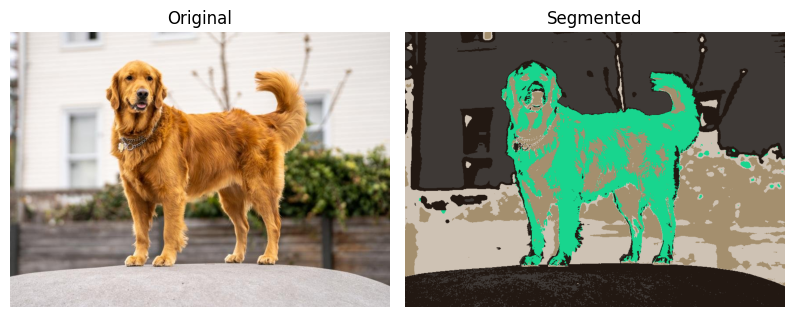

In [ ]:
images = [cv2.cvtColor(img, cv2.COLOR_BGR2RGB), cv2.cvtColor(segmented_image, cv2.COLOR_BGR2RGB)]
titles = ['Original', 'Segmented']

group_plot(images, titles)

### **Watershed Algorithm (Advanced Segmentation)**

* Watershed segmentation is a mathematical morphological method for partitioning an image into regions by treating it as a 3D topographic surface where pixel intensities represent height.
* The algorithm identifies "catchment basins" where water would accumulate if "flooded" from below. The boundaries of these basins, known as "watershed lines," represent the segmented object contours.
* This technique excels at separating touching or overlapping objects and produces closed, continuous borders at a low computational cost

It is used when objects are touching or overlapping.  
Steps:
* Convert to grayscale and apply threshold.
* Use distance transform + markers.
* Apply watershed to separate overlapping objects.

In [42]:
def group_plot(images, titles, cmap=['viridis']):
    num_images = len(images)
    cols = 3
    rows = (num_images + cols - 1) // cols

    plt.figure(figsize=(12, rows*2))
    for i in range(num_images):
        plt.subplot(rows, cols, i + 1)
        plt.imshow(images[i], cmap= cmap[i])
        plt.title(titles[i])
        plt.axis('off')

    plt.tight_layout()
    plt.show()

In [ ]:
image_path = 'images/coins.jpg'
assert image_path is not None, "Please provide a valid image file."

# 1. Load the image and convert it to grayscale
img = cv2.imread(image_path)
new_img = img.copy()
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# 2. Apply Otsu's thresholding to get a binary image
ret, thresh = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)

# 3. Use morphological operations to clean up the noise
kernel = np.ones((3, 3), np.uint8)
opening = cv2.morphologyEx(thresh, cv2.MORPH_OPEN, kernel, iterations=2)

# 4. Find the "sure background" and "sure foreground" areas
sure_bg = cv2.dilate(opening, kernel, iterations=1)
dist_transform = cv2.distanceTransform(opening, cv2.DIST_L2, 5)
ret, sure_fg = cv2.threshold(dist_transform, 0.7 * dist_transform.max(), 255, 0)
sure_fg = np.uint8(sure_fg)

# 5. Find the unknown region where foreground and background meet
unknown = cv2.subtract(sure_bg, sure_fg)

# 6. Create markers for the watershed algorithm
ret, markers = cv2.connectedComponents(sure_fg)
markers = markers + 1
markers[unknown == 255] = 0

# 7. Apply the watershed algorithm
markers = cv2.watershed(img, markers)
img[markers == -1] = [255, 0, 0]



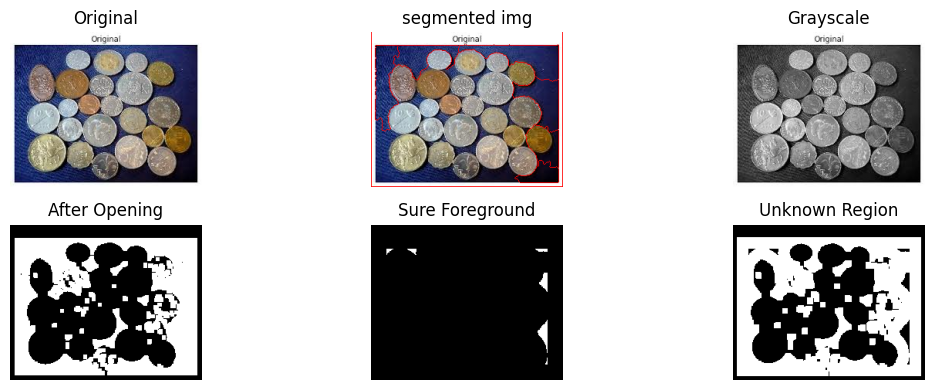

In [48]:
imgs = [new_img, img, gray, opening, sure_fg, unknown]
titles = ['Original', 'segmented img', 'Grayscale', 'After Opening', 'Sure Foreground', 'Unknown Region']
cmaps = ['viridis', 'viridis', 'gray', 'gray', 'gray', 'gray']

group_plot(imgs, titles, cmaps)

### **Grabcut image segmentation**

GrabCut is an interactive image segmentation algorithm used to separate a foreground object from its background with minimal user interaction. It leverages graph cuts and Gaussian Mixture Models (GMMs) in an iterative process to achieve accurate segmentation.

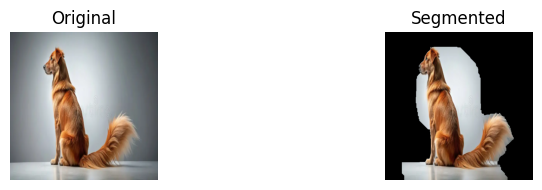

In [ ]:
# reading image
img = cv2.imread("images/dog2.webp")
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
img = cv2.resize(img, (500, 500))
assert img is not None, "Please provide a valid image file."

rect = (50, 50, 450, 450)

mask = np.zeros(img.shape[:2], np.uint8)
bgdModel = np.zeros((1, 65), np.float64)
fgdModel = np.zeros((1, 65), np.float64)

cv2.grabCut(img, mask, rect, bgdModel, fgdModel, 5, cv2.GC_INIT_WITH_RECT)

mask2 = np.where((mask == 2) | (mask == 0), 0, 1).astype('uint8')
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
output = img_rgb * mask2[:, :, np.newaxis]

imgs = [img_rgb, output]
titles = ['Original', 'Segmented']
cmap = ['viridis', 'viridis']

group_plot(imgs, titles, cmap = cmap)

## **Object Detection**

Object detection in OpenCV is the process of identifying and locating objects (like faces, cars, people) in images or video streams.   
It goes beyond segmentation by not just separating regions, but also labeling and bounding them.

### **Haar Cascade for Face Detection**

  Haar Cascade is a machine learning algorithm, also known as the Viola-Jones algorithm, that identifies objects like faces in images or videos by first training a classifier on positive (face) and negative (non-face) images.  
  It uses "Haar-like features" – simple rectangular patterns that represent variations in image intensity, like the difference between a bright nose and a dark eye region – to detect objects.  
  The algorithm then uses a "cascade" of these features in a multi-stage process to quickly scan an image, efficiently discarding non-face regions to speed up detection

In [ ]:
# load pretrained face detector
face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')

# load image
img = cv2.imread('images/faces.jpg')
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# detect faces
faces = face_cascade.detectMultiScale(gray, scaleFactor=1.1, minNeighbors=5)

# draw bounding boxes
new_img = img.copy()
for (x, y, w, h) in faces:
    cv2.rectangle(new_img, (x, y), (x+w, y+h), (255, 0, 0), 2)

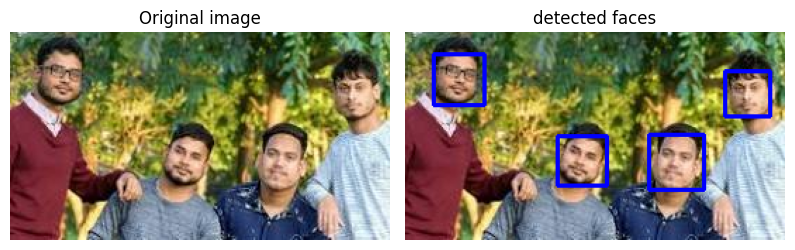

In [ ]:
images = [cv2.cvtColor(img, cv2.COLOR_BGR2RGB), cv2.cvtColor(new_img, cv2.COLOR_BGR2RGB)]
titles = ['Original image', 'detected faces']

group_plot(images, titles)

### **Contour Based Object Detection**

Contour-based object detection in OpenCV involves identifying and analyzing the boundaries of objects within an image. This method is particularly useful for detecting and segmenting objects based on their shape and outline.

In [ ]:
# load the image and gray scale conversion
img = cv2.imread('images/face1.jpeg')
img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# smoothening
blur = cv2.GaussianBlur(img_gray, (5, 5), 0)

# canny edge detection

edges = cv2.Canny(blur, 100, 200)

# find contours
contours, hierarchy = cv2.findContours(edges, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)


# drawing contours on original image with optional bounding boxes
for contour in contours:
  if cv2.contourArea(contour) > 50:
    cv2.drawContours(img, [contour], -1, (0, 255, 0), 2)

    x, y, w, h = cv2.boundingRect(contour)
    cv2.rectangle(img, (x, y), (x+w, y+h), (0, 0, 255), 2)

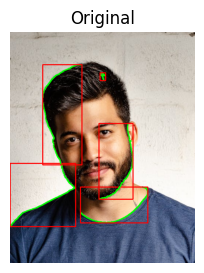

In [ ]:
# displaying result
plt.figure(figsize=(10, 3))
plt.subplot(1,2,1)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.title('Original')
plt.axis('off')
plt.show()

### **Object Detection with SSD (DNN Module)**

Single Shot MultiBox Detector (SSD) is a real-time object detection algorithm that performs both object localization and classification in a single forward pass of a deep neural network. It is known for its balance of speed and accuracy, making it suitable for applications requiring real-time performance.

In [ ]:
# reading image
img = cv2.imread('images/objects1.jpg')
(h, w) = img.shape[:2]

# loading the model
prototxt = 'models/deploy.prototxt.txt'
caffemodel='models/res10_300x300_ssd_iter_140000.caffemodel'
net =  cv2.dnn.readNetFromCaffe( prototxt, caffemodel)
blob = cv2.dnn.blobFromImage(cv2.resize(img, (300, 300)), 1.0, (300, 300), (104.0, 177.0, 123.0))
net.setInput(blob)
detections = net.forward()

new_img = img.copy()
for i in range(0, detections.shape[2]):
    confidence = detections[0, 0, i, 2]
    if confidence > 0.11:
      box = detections[0, 0, i, 3:7] * [w, h, w, h]
      (startX, startY, endX, endY) = box.astype('int')
      cv2.rectangle(img, (startX, startY), (endX, endY), (0, 255, 0), 2)

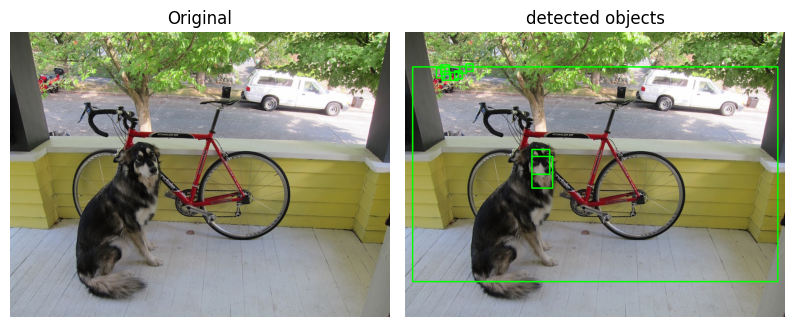

In [ ]:
images = [cv2.cvtColor(new_img, cv2.COLOR_BGR2RGB), cv2.cvtColor(img, cv2.COLOR_BGR2RGB)]
titles = ['Original', 'detected objects']

group_plot(images, titles)

### **Pedestrain Detection using HOG + SVM**

Pedestrian detection using Histogram of Oriented Gradients (HOG) and Support Vector Machines (SVM) is a classic and effective approach in computer vision. It involves extracting features from images and then classifying them to identify pedestrians.

In [ ]:
# loading models
hog = cv2.HOGDescriptor()
hog.setSVMDetector(cv2.HOGDescriptor_getDefaultPeopleDetector())

# loading image
img = cv2.imread('images/pedestrains1.jpg')

new_img = img.copy()
boxes, _ = hog.detectMultiScale(new_img)

for (x, y, w, h) in boxes:
    cv2.rectangle(new_img, (x, y), (x+w, y+h), (0, 255, 0), 2)

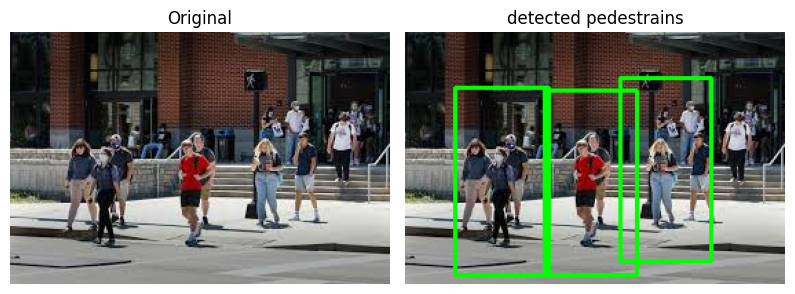

In [ ]:
images = [cv2.cvtColor(img, cv2.COLOR_BGR2RGB), cv2.cvtColor(new_img, cv2.COLOR_BGR2RGB)]
titles = ['Original', 'detected pedestrains']

group_plot(images, titles)

## **Image Pyramids**

Image pyramids in OpenCV are multi-scale representations of an image, where a single original image is successively downsampled to create a collection of images at different resolutions. This structure resembles a pyramid, with the largest, highest-resolution image at the base and progressively smaller, lower-resolution images at higher levels.

There are two main types of image pyramids in OpenCV:
* Guassian Pyramid
* Laplasian Pyramid

### **Guassian Pyramid**

* Used for downsampling images.
* Created by repeatedly applying a Gaussian blur filter and then downsampling (reducing the size by half in both width and height).
* The cv2.pyrDown() function in OpenCV is used to perform this operation. It applies a Gaussian blur and then subsamples the image, resulting in an output image that is half the size of the input.

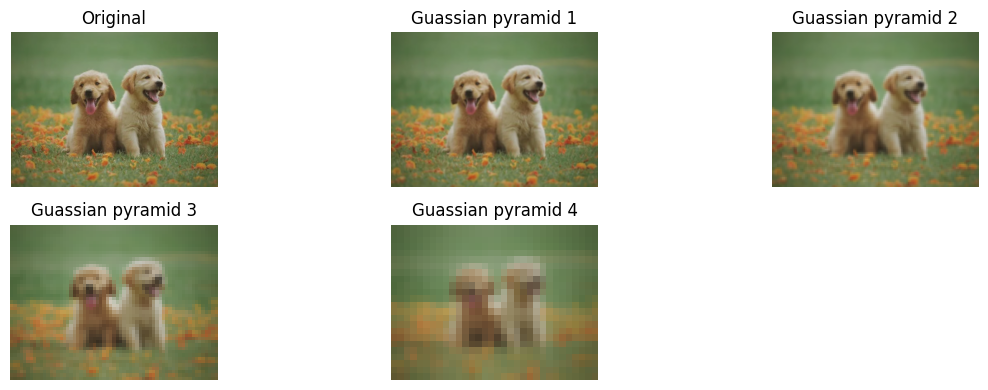

In [ ]:

num_levels = 5
img = cv2.imread('images/dogs3.webp')
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

pyramid = [img_rgb]
current_img = img_rgb.copy()

for _ in range(num_levels - 1):
    current_img = cv2.pyrDown(current_img)
    pyramid.append(current_img)

# plotting
titles = ['Original', 'Guassian pyramid 1', 'Guassian pyramid 2', 'Guassian pyramid 3', 'Guassian pyramid 4', 'Guassian pyramid 5']

group_plot(pyramid, titles)


### **Laplassian Pyramid**

* A Laplacian pyramid is built from a Gaussian pyramid and highlights the high-frequency details (like edges) lost during the downsampling process.  
* It is created by generating a Gaussian pyramid and then, for each level, subtracting the upscaled version of the next level from the current level.

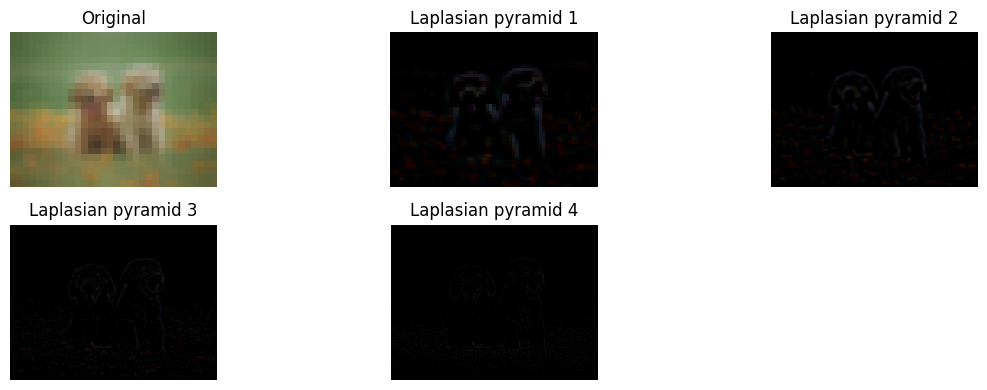

In [ ]:
num_levels = 5
img = cv2.imread('images/dogs3.webp')
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

gaussian_pyramid = [img_rgb]
current_image = img_rgb.copy()

for i in range(num_levels - 1):
  current_image = cv2.pyrDown(current_image)
  gaussian_pyramid.append(current_image)

laplacian_pyramid = []

laplacian_pyramid.append(gaussian_pyramid[num_levels - 1])


for i in range(num_levels-1, 0, -1):
  size = (gaussian_pyramid[i-1].shape[1], gaussian_pyramid[i-1].shape[0])
  expanded_image = cv2.pyrUp(gaussian_pyramid[i], dstsize=size)

  laplacian = cv2.subtract(gaussian_pyramid[i-1], expanded_image)
  laplacian_pyramid.append(laplacian)


# plotting

titles = ['Original', 'Laplasian pyramid 1','Laplasian pyramid 2', 'Laplasian pyramid 3', 'Laplasian pyramid 4']
group_plot(laplacian_pyramid, titles, cmap='gray')

## **Image Inpainting**

Image inpainting is the process of reconstructing missing, damaged, or unwanted parts of an image in a way that makes the result look natural and seamless. It’s like digital patchwork—filling in gaps using surrounding visual information.

Steps for image inpainting:

- Identify the missing or damaged area.

- Analyze surrounding pixels—color, texture, patterns.

- Fill the gap using algorithms or models that mimic the surrounding content.

- Blend and smooth to make the patch invisible.

In [ ]:
# load the image
img = cv2.imread('images/img_inpaint.png')

# finding the mask region
img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
_, mask = cv2.threshold(img_gray, 180, 255, cv2.THRESH_BINARY)

# Apply inpainting using Telea or Navier-Stokes method
inpainted_telea = cv2.inpaint(img, mask, inpaintRadius=300, flags=cv2.INPAINT_TELEA)
inpainted_ns = cv2.inpaint(img, mask, inpaintRadius=300, flags=cv2.INPAINT_NS)

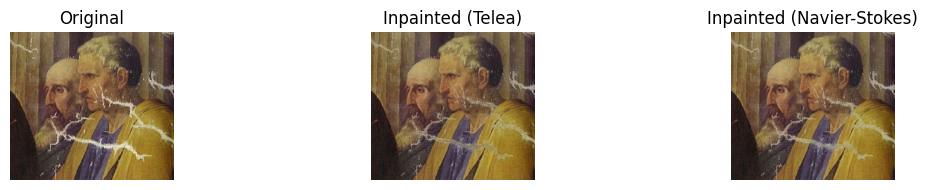

In [111]:
inpainted_images = [cv2.cvtColor(img, cv2.COLOR_BGR2RGB), cv2.cvtColor(inpainted_telea, cv2.COLOR_BGR2RGB), cv2.cvtColor(inpainted_ns, cv2.COLOR_BGR2RGB)]
titles = ['Original', 'Inpainted (Telea)', 'Inpainted (Navier-Stokes)']
group_plot(inpainted_images, titles, cmap=['viridis']*3)

## **Line Detection**

Line detection is an image processing technique used to find straight lines within an image. It is often used for feature extraction in applications like robotics, autonomous vehicles, and medical imaging.

Methods for Line Detection:
- Standard Hough Transform
- Probabilistic Hough Transform

### **Standard Hough Transform**

The standard Hough transform is a feature extraction technique used in image processing to detect simple geometric shapes, like straight lines, by converting image space into a parameter space. It is robust against image noise and works even when the shapes are distorted, incomplete, or partially obscured.


Working of Standard Hough Transform
* Image space to parameter space
* Accumulator array
* Voting process
* Peak detection
* Line extraction

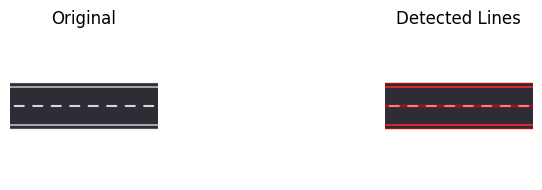

In [ ]:
img = cv2.imread('images/road.jpg')
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

edges = cv2.Canny(gray, 50, 150, apertureSize=3)

lines = cv2.HoughLines(edges, 1, np.pi/180, 200)

new_img = img.copy()
for line in lines:
    rho, theta = line[0]
    a = np.cos(theta)
    b = np.sin(theta)
    x0 = a * rho
    y0 = b * rho
    x1 = int(x0 + 1000 * (-b))
    y1 = int(y0 + 1000 * (a))
    x2 = int(x0 - 1000 * (-b))
    y2 = int(y0 - 1000 * (a))
    cv2.line(new_img, (x1, y1), (x2, y2), (0, 0, 255), 2)

imgs = [cv2.cvtColor(img, cv2.COLOR_BGR2RGB), cv2.cvtColor(new_img, cv2.COLOR_BGR2RGB)]
titles = ['Original', 'Detected Lines']

group_plot(imgs, titles, cmap=['viridis']*2)

### **Probabilistic Hough Transform**

The Probabilistic Hough Transform (PHT) is an efficient optimization of the standard Hough transform that uses random sampling to find lines and line segments in an image. It is often used in real-time applications because it significantly reduces the computational load compared to the standard version, which checks every single edge pixel.

Working of Probabilistic Hough Transform:
* Select random pixel
* vote for lines
* Find a strong candidate
* Trace the line
* Remove detected pixels
* Repeat

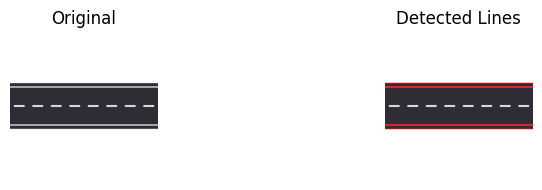

In [ ]:
img = cv2.imread('images/road.jpg')
assert img is not None, "Please provide a valid image file path."

gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
edges = cv2.Canny(gray, 50, 150, apertureSize=3)

lines = cv2.HoughLinesP(edges, 1, np.pi/180, 100, minLineLength=100, maxLineGap=10)

new_img = img.copy()
for line in lines:
    x1, y1, x2, y2 = line[0]
    cv2.line(new_img, (x1, y1), (x2, y2), (0, 0, 255), 2)

imgs = [cv2.cvtColor(img, cv2.COLOR_BGR2RGB), cv2.cvtColor(new_img, cv2.COLOR_BGR2RGB)]
titles = ['Original', 'Detected Lines']

group_plot(imgs, titles, cmap=['viridis']*2)

## **Histogram Analysis**

A histogram in image processing is a graphical representation of the number of pixels at each intensity level in an image.

* For grayscale images: It shows how many pixels have intensity values from 0 (black) to 255 (white).
* For color images: You can compute separate histograms for each channel (Red, Green, Blue).

**Histograms help you:**

* Understand image contrast, brightness, and intensity distribution.
* Detect underexposed or overexposed regions.
* Guide preprocessing steps like thresholding, equalization, and segmentation.

**Applications of Histogram in Image Processing**:
* Histogram Equalization	- Enhance contrast by redistributing intensity values
* Adaptive Thresholding	 - Segment images based on local intensity variations
* Image Segmentation	- Separate foreground and background using intensity peaks
* Contrast Stretching	- Improve visibility by expanding intensity range
* Backprojection (in color) - Object tracking using histogram of target color
* Histogram Matching - Adjust image to match the histogram of another




### **Histogram from Gray Scale**

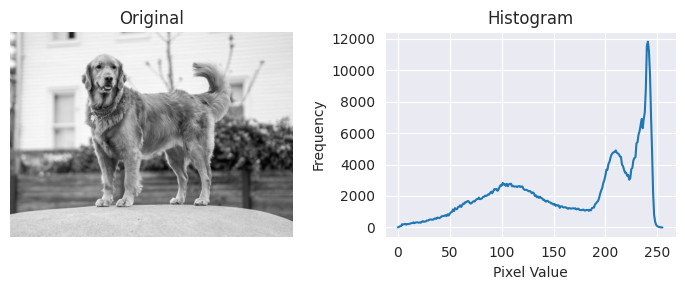

In [ ]:
# sample image histogram observing

import seaborn as sns
sns.set_style('darkgrid')

img = cv2.imread('images/dog1.jpeg')
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

hist = cv2.calcHist([gray], [0], None, [256], [0, 256])

plt.figure(figsize=(7, 3))
plt.subplot(1,2,1)
plt.imshow(gray, cmap='gray')
plt.title('Original')
plt.axis('off')
plt.subplot(1,2,2)
plt.plot(hist)
plt.title('Histogram')
plt.xlabel('Pixel Value')
plt.ylabel('Frequency')
plt.tight_layout()
plt.show()

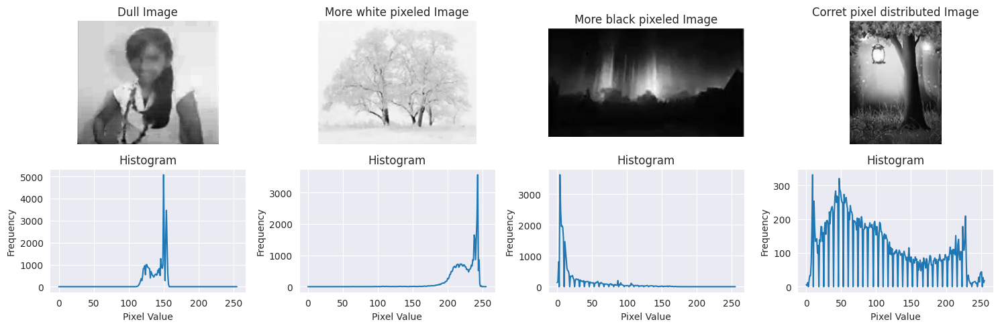

In [ ]:
# variation observing in different gray plots

img1 = cv2.imread('images/gray_img_1.png', 0)
img2 = cv2.imread('images/gray_img_2.png', 0)
img3 = cv2.imread('images/gray_img_3.png', 0)
img4 = cv2.imread('images/gray_img_4.png', 0)

hist1 = cv2.calcHist([img1], [0], None, [256], [0, 256])
hist2 = cv2.calcHist([img2], [0], None, [256], [0, 256])
hist3 = cv2.calcHist([img3], [0], None, [256], [0, 256])
hist4 = cv2.calcHist([img4], [0], None, [256], [0, 256])

plt.figure(figsize=(15, 5))
plt.subplot(2,4,1)
plt.imshow(img1, cmap='gray')
plt.title('Dull Image')
plt.axis('off')
plt.subplot(2,4,5)
plt.plot(hist1)
plt.title('Histogram')
plt.xlabel('Pixel Value')
plt.ylabel('Frequency')
plt.subplot(2,4,2)
plt.imshow(img2, cmap='gray')
plt.title('More white pixeled Image')
plt.axis('off')
plt.subplot(2,4,6)
plt.plot(hist2)
plt.title('Histogram')
plt.xlabel('Pixel Value')
plt.ylabel('Frequency')
plt.subplot(2,4,3)
plt.imshow(img3, cmap='gray')
plt.title('More black pixeled Image')
plt.axis('off')
plt.subplot(2,4,7)
plt.plot(hist3)
plt.title('Histogram')
plt.xlabel('Pixel Value')
plt.ylabel('Frequency')
plt.subplot(2,4,4)
plt.imshow(img4, cmap='gray')
plt.title('Corret pixel distributed Image')
plt.axis('off')
plt.subplot(2,4,8)
plt.plot(hist4)
plt.title('Histogram')
plt.xlabel('Pixel Value')
plt.ylabel('Frequency')

plt.tight_layout()
plt.show()

We can observe the pixels distribution from the above types of gray images

### **Histogram for colored image**

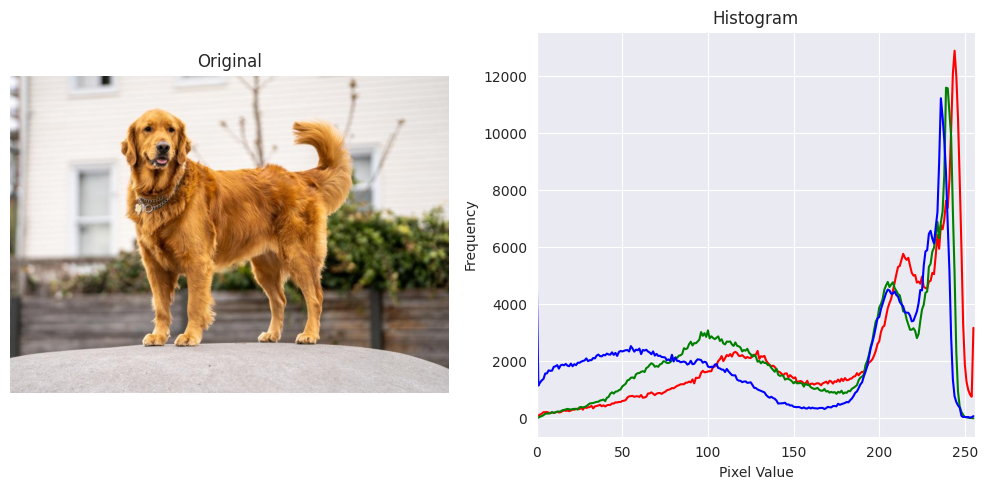

In [ ]:
img = cv2.imread('images/dog1.jpeg')
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

colors = ('r', 'g', 'b')

plt.figure(figsize=(10, 5))
plt.subplot(1,2,1)
plt.imshow(img_rgb)
plt.title('Original')
plt.axis('off')
plt.subplot(1,2,2)
for i, col in enumerate(colors):
    hist = cv2.calcHist([img_rgb], [i], None, [256], [0, 256])
    plt.plot(hist, color=col)
    plt.xlim([0, 256])

plt.title('Histogram')
plt.xlabel('Pixel Value')
plt.ylabel('Frequency')
plt.tight_layout()
plt.show()

### **Histogram Equalization**

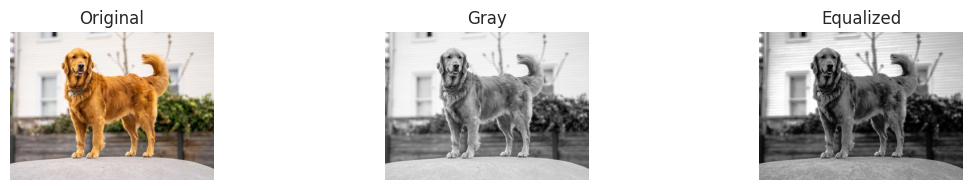

In [ ]:
img = cv2.imread('images/dog1.jpeg')
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

equalized = cv2.equalizeHist(gray)

imgs = [img_rgb, gray, equalized]
titles = ['Original','Gray', 'Equalized']

group_plot(imgs, titles, cmap=['viridis', 'gray', 'gray'])

## **Feature Detection and Extraction**

Feature detection and extraction in image processing identifies and quantifies unique points, patterns, and structures (features) from raw pixel data to reduce dimensionality, improve accuracy, and enhance computational efficiency for computer vision tasks like object recognition and image classification.  
This process involves techniques ranging from finding basic elements like edges and corners to extracting complex learned features using methods such as SIFT, SURF, or Convolutional Neural Networks (CNNs)

### **Harris Corner Detection**

* Harris Corner Detection is a classic technique in computer vision used to identify corners or interest points in an image.  
* These corners are useful for tasks like object recognition, image matching, and motion tracking.  
* Harris Corner Detection identifies points in an image where the intensity changes significantly in multiple directions. These points are typically corners or junctions of edges.

In [ ]:
# loading the image
img = cv2.imread('images/building.jpg')
new_img = img.copy()
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# Convert to float32 for cornerHarris
gray = np.float32(gray)

# Apply Harris Corner Detection
dst = cv2.cornerHarris(gray, blockSize=2, ksize=3, k=0.04)

# Dilate result for better visibility
dst = cv2.dilate(dst, None)

# Threshold to mark corners in red
new_img[dst > 0.01 * dst.max()] = [0, 0, 255]

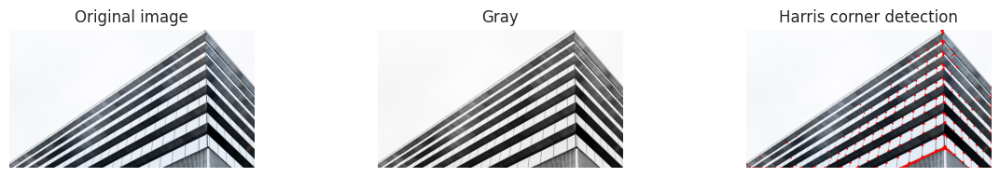

In [154]:
imgs = [cv2.cvtColor(img, cv2.COLOR_BGR2RGB), gray, cv2.cvtColor(new_img, cv2.COLOR_BGR2RGB)]
titles = ['Original image', 'Gray', 'Harris corner detection']
group_plot(imgs, titles, cmap = ['viridis', 'gray', 'viridis'])

### **Shi-Tomasi Corner Detection**

* Shi-Tomasi Corner Detection is an improvement over Harris Corner Detection and is widely used in feature tracking algorithms like Lucas-Kanade optical flow.
* Shi-Tomasi is a corner detection method that selects points based on the minimum eigenvalue of the structure tensor matrix. It’s more robust than Harris because it avoids false positives and gives better quality corners.

In [ ]:
img = cv2.imread('images/building.jpg')
new_img = img.copy()
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# Shi-Tomasi / Good Features to Track
corners = cv2.goodFeaturesToTrack(gray,
                                  maxCorners=50,
                                  qualityLevel=0.01,
                                  minDistance=10)
# Converting to int type
corners = corners.astype(int)

# Drawing the corners
for c in corners:
    x, y = c.ravel()
    cv2.circle(new_img, (x, y), 8, (0, 0,255), -1)

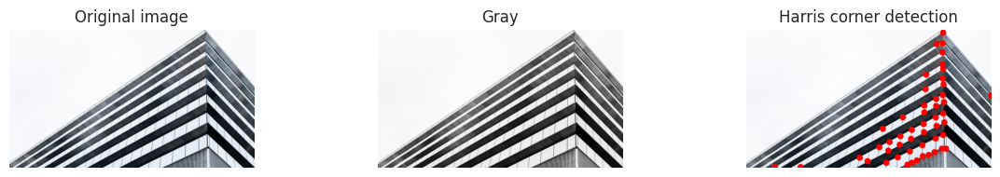

In [160]:
imgs = [cv2.cvtColor(img, cv2.COLOR_BGR2RGB), gray, cv2.cvtColor(new_img, cv2.COLOR_BGR2RGB)]
titles = ['Original image', 'Gray', 'Harris corner detection']
group_plot(imgs, titles, cmap = ['viridis', 'gray', 'viridis'])

### **SIFT- (Scale-Invariant Feature Transform)**

* SIFT stands for Scale-Invariant Feature Transform, an algorithm in computer vision that detects and describes distinctive "keypoints" or local features within images, making them robust against changes in scale, rotation, and illumination.  
* By generating a database of these stable features, SIFT enables applications like object recognition, image stitching, and 3D modeling by allowing for reliable matching of features between different images of the same object or scene

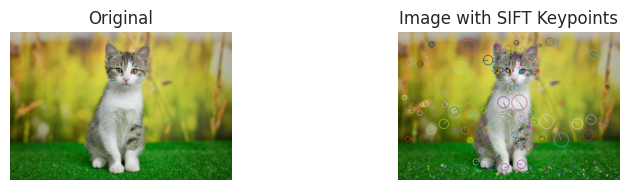

In [ ]:
img = cv2.imread('images/cat4.jpg')
img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# Initialize SIFT detector
sift = cv2.SIFT_create()

# Detect keypoints and compute descriptors
keypoints, descriptors = sift.detectAndCompute(img, None)

# Draw keypoints on the image
img_with_keypoints = cv2.drawKeypoints(img, keypoints, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

imgs = [cv2.cvtColor(img, cv2.COLOR_BGR2RGB), cv2.cvtColor(img_with_keypoints, cv2.COLOR_BGR2RGB)]
titles = ['Original', 'Image with SIFT Keypoints']
group_plot(imgs, titles, cmap = ['viridis', 'viridis'])

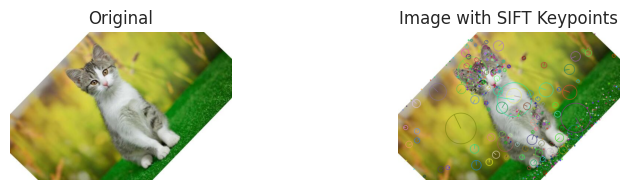

In [ ]:
# for rotated image

img = cv2.imread('images/cat4_rotate.jpg')
img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# Initialize SIFT detector
sift = cv2.SIFT_create()

# Detect keypoints and compute descriptors
keypoints, descriptors = sift.detectAndCompute(img, None)

# Draw keypoints on the image
img_with_keypoints = cv2.drawKeypoints(img, keypoints, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

imgs = [cv2.cvtColor(img, cv2.COLOR_BGR2RGB), cv2.cvtColor(img_with_keypoints, cv2.COLOR_BGR2RGB)]
titles = ['Original', 'Image with SIFT Keypoints']
group_plot(imgs, titles, cmap = ['viridis', 'viridis'])

#### **Keypoint Localization & Descriptor Extraction**

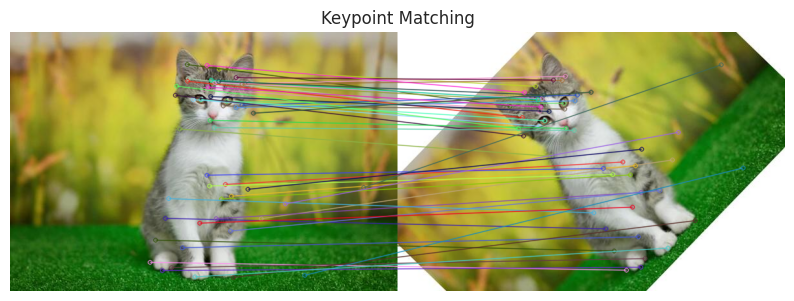

In [ ]:
# Load two images in grayscale
img1 = cv2.imread('images/cat4.jpg')
img2 = cv2.imread('images/cat4_rotate.jpg')

# Keypoint Localization and Descriptor Extraction
sift = cv2.SIFT_create()
kp1, des1 = sift.detectAndCompute(img1, None)
kp2, des2 = sift.detectAndCompute(img2, None)

# key point matching
bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=True)
matches = bf.match(des1, des2)

# Sort matches by distance (lower is better)
matches = sorted(matches, key=lambda x: x.distance)

# Step 3: Draw top matches
matched_img = cv2.drawMatches(img1, kp1, img2, kp2, matches[:50], None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)


plt.figure(figsize=(10, 5))
plt.imshow(cv2.cvtColor(matched_img, cv2.COLOR_BGR2RGB))
plt.title('Keypoint Matching')
plt.axis('off')
plt.show()